<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Import" data-toc-modified-id="Import-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Import</a></span></li><li><span><a href="#Function" data-toc-modified-id="Function-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Function</a></span></li><li><span><a href="#Size-CA" data-toc-modified-id="Size-CA-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Size CA</a></span><ul class="toc-item"><li><span><a href="#Load-NN" data-toc-modified-id="Load-NN-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Load NN</a></span></li><li><span><a href="#Bar-plot" data-toc-modified-id="Bar-plot-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Bar plot</a></span></li><li><span><a href="#Comparison-Size" data-toc-modified-id="Comparison-Size-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Comparison Size</a></span></li></ul></li><li><span><a href="#Time-course-Activation" data-toc-modified-id="Time-course-Activation-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Time course Activation</a></span><ul class="toc-item"><li><span><a href="#Difference-Act/Obj" data-toc-modified-id="Difference-Act/Obj-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Difference Act/Obj</a></span></li><li><span><a href="#Difference-Activity-Total-/-Activity-of-CA-Pattern-showed" data-toc-modified-id="Difference-Activity-Total-/-Activity-of-CA-Pattern-showed-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Difference Activity Total / Activity of CA Pattern showed</a></span><ul class="toc-item"><li><span><a href="#Action" data-toc-modified-id="Action-4.2.1"><span class="toc-item-num">4.2.1&nbsp;&nbsp;</span>Action</a></span></li><li><span><a href="#Object" data-toc-modified-id="Object-4.2.2"><span class="toc-item-num">4.2.2&nbsp;&nbsp;</span>Object</a></span></li></ul></li><li><span><a href="#All-Area-TCA" data-toc-modified-id="All-Area-TCA-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>All Area TCA</a></span><ul class="toc-item"><li><span><a href="#Action" data-toc-modified-id="Action-4.3.1"><span class="toc-item-num">4.3.1&nbsp;&nbsp;</span>Action</a></span></li><li><span><a href="#Object" data-toc-modified-id="Object-4.3.2"><span class="toc-item-num">4.3.2&nbsp;&nbsp;</span>Object</a></span></li></ul></li><li><span><a href="#System-Area-TCA" data-toc-modified-id="System-Area-TCA-4.4"><span class="toc-item-num">4.4&nbsp;&nbsp;</span>System Area TCA</a></span><ul class="toc-item"><li><span><a href="#Curve" data-toc-modified-id="Curve-4.4.1"><span class="toc-item-num">4.4.1&nbsp;&nbsp;</span>Curve</a></span></li></ul></li><li><span><a href="#Max-stp" data-toc-modified-id="Max-stp-4.5"><span class="toc-item-num">4.5&nbsp;&nbsp;</span>Max stp</a></span><ul class="toc-item"><li><span><a href="#Box-plot" data-toc-modified-id="Box-plot-4.5.1"><span class="toc-item-num">4.5.1&nbsp;&nbsp;</span>Box plot</a></span></li></ul></li></ul></li><li><span><a href="#Maximum-TCA-Area" data-toc-modified-id="Maximum-TCA-Area-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Maximum TCA Area</a></span><ul class="toc-item"><li><span><a href="#Add-presentation-Total-Area" data-toc-modified-id="Add-presentation-Total-Area-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Add presentation Total Area</a></span></li><li><span><a href="#READ-TCA--AREA" data-toc-modified-id="READ-TCA--AREA-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>READ TCA  AREA</a></span></li><li><span><a href="#Order-File-==&gt;-WORKING" data-toc-modified-id="Order-File-==>-WORKING-5.3"><span class="toc-item-num">5.3&nbsp;&nbsp;</span>Order File ==&gt; WORKING</a></span></li><li><span><a href="#Test-Plot" data-toc-modified-id="Test-Plot-5.4"><span class="toc-item-num">5.4&nbsp;&nbsp;</span>Test Plot</a></span></li></ul></li><li><span><a href="#Test-TCA" data-toc-modified-id="Test-TCA-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Test TCA</a></span></li></ul></div>

## Import

In [1172]:
import pandas as pd
import matplotlib.pyplot as plt
import glob
import seaborn as sns; sns.set_theme()
import numpy as np
from scipy import stats
plt.rcParams["figure.figsize"] = (20,10)
plt.rcParams["font.size"] = "15"
import warnings
plt.rcParams["figure.autolayout"] = True
warnings.filterwarnings("ignore")
import warnings
plt.rcParams["figure.autolayout"] = True
warnings.filterwarnings("ignore")

## Function 

In [1115]:
def add_specificity(df_clean_activity, specificity):
    data = pd.concat([df_clean_activity], keys=[specificity], names=['Specificity'])
    return data

def structures_CA_structure_txt_file(directory):
    data = pd.read_csv(directory, sep = " ")
    data = data.reset_index().drop(columns=['Unnamed: 0','Unnamed: 1', 'level_0', 'level_1'])
    data = data.rename(columns={"level_2":'CA',
                            "level_3":'Presentation'})
    data['CA'] = data['CA'].str.replace('#',"").astype(float)
    data['Presentation'] = data['Presentation'].str.replace(':',"").astype(float)
    data = data.set_index(['CA', 'Presentation'])
    columns_name = ['V1', 'TO', 'AT', 'PFL', 'PML', 'M1L', 'A1', 'AB', 'PB', 'PFI', 'PMI', 'M1I']
    data.columns = columns_name 
    return data

def seprate_obj_act(data):
    obj = data.reset_index()[data.reset_index()['CA']<=6].set_index(['CA','Presentation'])
    act  = data.reset_index()[data.reset_index()['CA']>6].set_index(['CA','Presentation'])
    data = pd.concat([add_specificity(obj, "Obj"), add_specificity(act, "Act")])
    return data

def add_nb_presentation(df_CA_structure, nb_presentation):
    data = pd.concat([df_CA_structure], keys=[nb_presentation], names=['Nb Presentation'])
    return data

def add_NN_Number(df_clean_activity, number):
    data = pd.concat([df_clean_activity], keys=[number], names=['Network'])
    return data


def barplors_error(data, specificity):
    data_act = data.xs(specificity,0,'Specificity').reset_index()
    #data_act = data_act[(data_act.Presentation==1000) | (data_act.Presentation==3000)]
    max_value = data_act.groupby('Presentation').mean().max().max() + 5
    
    font_size_number =20
    fig, ax = plt.subplots(6, 2)
    for i in range(0, 12):
        plt.subplot(2,6, (i+1))
        area = data_act.iloc[:,3:].columns[i]
        ax = sns.barplot(x="Presentation", y=area, data=data_act, palette="Blues_d")
        plt.ylim([0, max_value])
        plt.xticks(rotation=45, ha='right')
        plt.title(area, fontsize=font_size_number)
        plt.ylabel("")
        plt.xlabel("")
        ax.xaxis.set_tick_params(labelsize=font_size_number)
        
        #plt.title('Sum total of CA', fontsize=font_size_number)
        plt.xticks(fontsize=font_size_number-5)
        plt.yticks(fontsize=font_size_number)
        #plt.ylabel('Number of Neurons', fontsize=font_size_number)
        #plt.xlabel('Presentation', fontsize=font_size_number)

    left  = 0.05  # the left side of the subplots of the figure
    right = 0.8    # the right side of the subplots of the figure
    bottom = 0.1   # the bottom of the subplots of the figure
    top = 0.9      # the top of the subplots of the figure
    wspace = 0.4   # the amount of width reserved for blank space between subplots
    hspace = 0.4   # the amount of height reserved for white space between subplots
    plt.subplots_adjust(left, bottom, right, top, wspace, hspace)
    plt.suptitle(specificity + '  Words',fontsize=font_size_number+10)
    fig.supylabel("Number of Neurons", fontsize=font_size_number)

    
def merge_networks(directoryS_list):
    networkS = []
    for network in range(0, len(directoryS_list)):
        data_spike_normal  = structures_CA_structure_txt_file(directoryS_list[network])
        data_spike_normal = seprate_obj_act(data_spike_normal)
        data_spike_normal = add_NN_Number(data_spike_normal, str(network))
        networkS.append(data_spike_normal)
    return pd.concat(networkS).dropna()

def spe_presentation_sep(df, presentation):
    "Separate for each specificity and given presentation"
    act = df.xs(presentation,0,'Presentation').xs('Act',0,'Specificity')
    obj = df.xs(presentation,0,'Presentation').xs('Obj',0,'Specificity')
    return act, obj 

def comparison_presentation(total_spike, presentation):
    total_spike_mean = total_spike_normal.xs(presentation,0,'Presentation')#.groupby('Specificity').mean()
    max_value = total_spike_mean.mean().max() + 1
    
    act, obj = spe_presentation_sep(total_spike, presentation)

    font_size_number = 20
    fig, ax = plt.subplots(6, 2)
    for i in range(0, 12):
        plt.subplot(2,6, (i+1))
        area = total_spike_mean.columns[i]
        p_value = stats.ttest_ind(act[area], obj[area])[1]
        ax = sns.barplot(x="Specificity", y=area, data=total_spike_mean.reset_index(), palette="tab10")
        plt.ylim([0, max_value])
        plt.xticks(rotation=45, ha='right')
        if p_value > 0.05:
            plt.title(area, fontsize=font_size_number)
        if p_value <0.05:
             plt.title(area + ' | '+str('{:.2e}'.format(p_value)), fontsize=font_size_number, color='firebrick')  
        plt.ylabel("")
        plt.xlabel("")
        ax.xaxis.set_tick_params(labelsize=font_size_number)

        #plt.title('Sum total of CA', fontsize=font_size_number)
        plt.xticks(fontsize=font_size_number)
        plt.yticks(fontsize=font_size_number)
        #plt.ylabel('Number of Neurons', fontsize=font_size_number)
        #plt.xlabel('Presentation', fontsize=font_size_number)

    left  = 0.05  # the left side of the subplots of the figure
    right = 0.8    # the right side of the subplots of the figure
    bottom = 0.1   # the bottom of the subplots of the figure
    top = 0.9      # the top of the subplots of the figure
    wspace = 0.4   # the amount of width reserved for blank space between subplots
    hspace = 0.4   # the amount of height reserved for white space between subplots
    plt.subplots_adjust(left, bottom, right, top, wspace, hspace)
    plt.suptitle(str(presentation) + '  Presentations',fontsize=font_size_number+5)
    fig.supylabel("Number of Nedddurons",fontsize=font_size_number+5)

## Size CA
### Load NN

In [1113]:
directory_spike_normal1 = "/Users/mc/Downloads/results_R1/CA-structure.txt"
directory_spike_normal2 = "/Users/mc/Downloads/results_R2/CA-structure.txt"
directory_spike_normal3 = "/Users/mc/Downloads/results_R3/CA-structure.txt"
directory_spike_normal4 = "/Users/mc/Downloads/results_R4/CA-structure.txt"
directory_spike_normal5 = "/Users/mc/Downloads/results_R5/CA-structure.txt"
directory_spike_normal6 = "/Users/mc/Downloads/results_R6/CA-structure.txt"
directory_spike_normal7 = "/Users/mc/Downloads/results_R7/CA-structure.txt"
directory_spike_normal8 = "/Users/mc/Downloads/results_R8/CA-structure.txt"
directory_spike_normal9 = "/Users/mc/Downloads/results_R9/CA-structure.txt"
directory_spike_normal10 = "/Users/mc/Downloads/results_R10/CA-structure.txt"
directory_spike_normal11 = "/Users/mc/Downloads/results_R11/CA-structure.txt"
directory_spike_normal12 = "/Users/mc/Downloads/results_R12/CA-structure.txt"


directoryS_list = [directory_spike_normal1, directory_spike_normal2, directory_spike_normal3,
                  directory_spike_normal4, directory_spike_normal5, directory_spike_normal6,
                  directory_spike_normal7, directory_spike_normal8, directory_spike_normal9, 
                   directory_spike_normal9,directory_spike_normal11, directory_spike_normal12]
total_spike_normal = merge_networks(directoryS_list)


## Remove 4011 and 0
total_spike_normal = total_spike_normal.reset_index()[total_spike_normal.reset_index()['Presentation']!=4011]
total_spike_normal = total_spike_normal.reset_index()[total_spike_normal.reset_index()['Presentation']!=0]
total_spike_normal = total_spike_normal.set_index(['Network', 'Specificity','CA','Presentation']).drop(columns=['index'])
total_spike_normal

V1  TO  AT  PFL  PML  M1L  A1  AB  PB  \
Network Specificity CA   Presentation                                          
0       Obj         1.0  10.0           0   0   0    0    0    0  19   0   0   
                    2.0  10.0           0   0   0    0    0    0  18   0   0   
                    3.0  10.0           0   0   0    0    0    0  19   0   0   
                    4.0  10.0           0   0   0    0    0    0  19   0   0   
                    5.0  10.0           0   0   0    0    0    0  19   0   0   
...                                    ..  ..  ..  ...  ...  ...  ..  ..  ..   
11      Act         8.0  3000.0         0   4   8   12    4    3   6  12  10   
                    9.0  3000.0         0   2   4    5    5    4   7   7  11   
                    10.0 3000.0         0   2   7    8    4    4   8   3  11   
                    11.0 3000.0         0   3   6    4    5    7   6   6  12   
                    12.0 3000.0         0   1   5    2    7    3   4   4   6   

                                       PFI  PMI  M1I  
Network Specificity CA   Presentation                 
0       Obj         1.0  10.0            0    0   19  
                    2.0  10.0            0    0   19  
                    3.0  10.0            0    0   19  
                    4.0  10.0            0    0   18  
                    5.0  10.0            0    0   16  
...                                    ...  ...  ...  
11      Act         8.0  3000.0         11    7    5  
                    9.0  3000.0          6   11    5  
                    10.0 3000.0         10    9    6  
                    11.0 3000.0         13    5    7  
                    12.0 3000.0         11    8    3  

[1476 rows x 12 columns]

### Bar plot

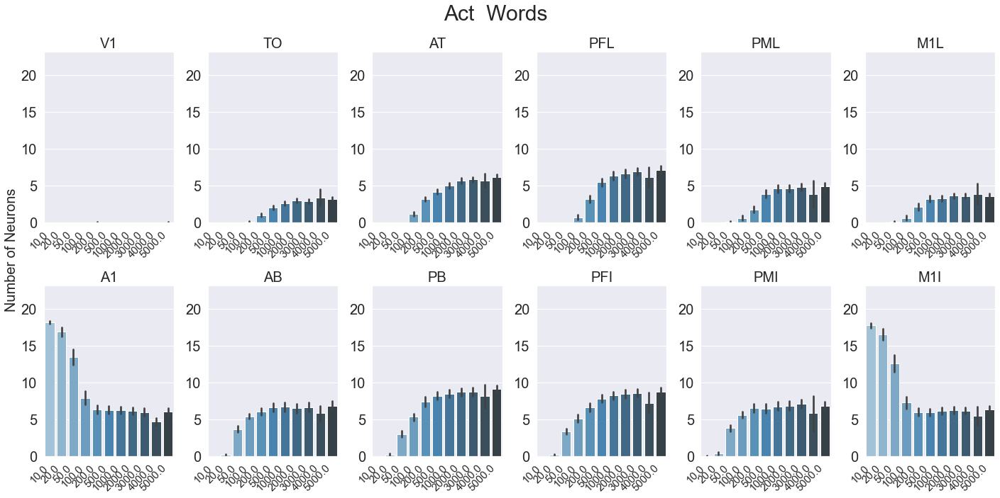

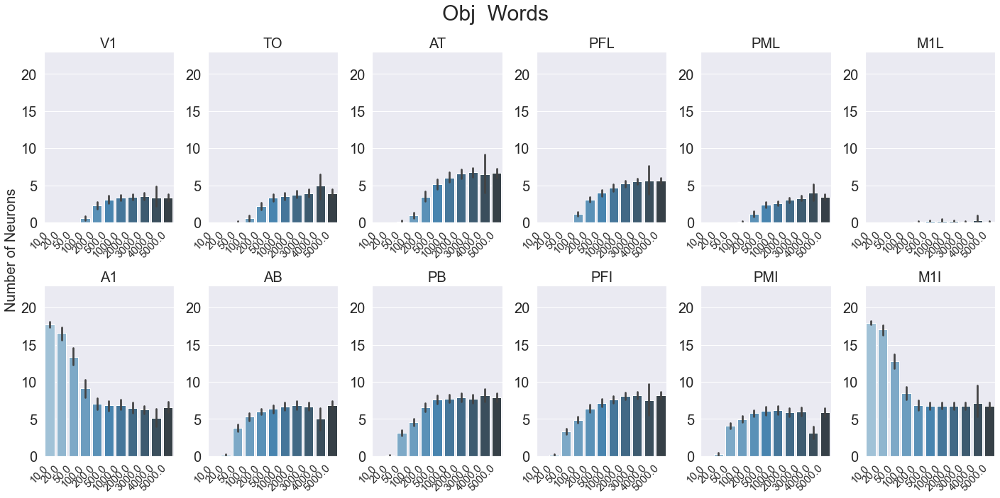

In [1116]:
barplors_error(total_spike_normal, "Act")
barplors_error(total_spike_normal, "Obj")

### Comparison Size

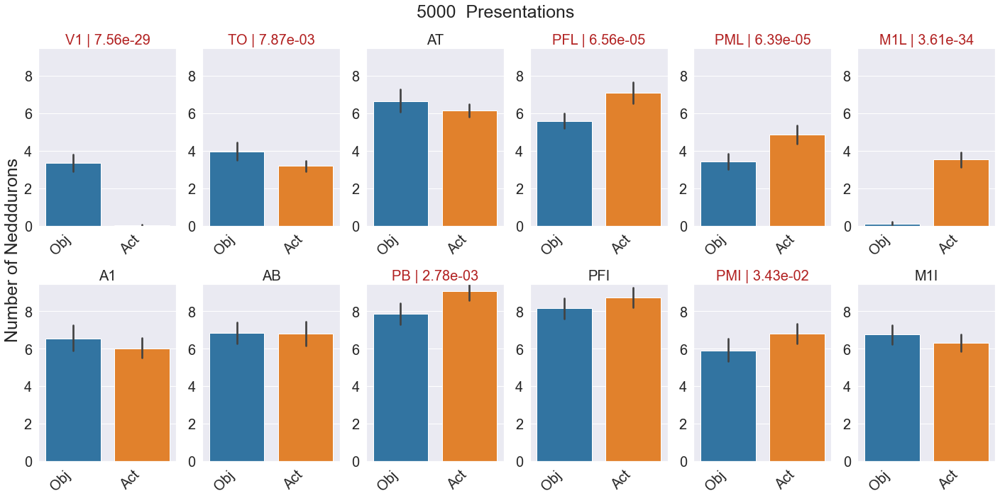

In [1117]:
presentation = 5000
comparison_presentation(total_spike_normal, presentation)

## Time course Activation

In [1118]:
def remove_0_and_13(df):
    df = df[df.patt_no>0]
    df = df[df.patt_no<13]
    return df

def add_presentation_total(df, order_file):
    "Add presentation based on order of file for the total df"
    nb_time_step = int(len(df)/len(order_file))
    df_pres = []
    for i in range(0, len(order_file)):
        #df_pres.append(add_presentation(df.iloc[i*nb_time_step:nb_time_step*(i+1)], order_file[i]))
        df_pres.append(add_presentation(df[df.Network==i], order_file[i]))
    df_pres = pd.concat(df_pres).reset_index().drop(columns=['level_1', 'Network'])
    df_pres = df_pres.sort_values(by=['Presentation', 'stim', 'Pattern','patt_no']).set_index('Presentation')
    return df_pres

def add_presentation(df, presentation):
    "Add presentation as index"
    data = pd.concat([df], keys=[presentation], names=['Presentation'])
    return data

def shorten_stp(df, from_, to_):
    "Remove time step above and below/.."
    df = df[(df.stp>from_)&(df.stp<to_)]
    return df

def add_specificity_patt_no(df):
    df_obj = df[df.patt_no<7]
    df_act = df[df.patt_no>6]
    df = pd.concat([add_specificity(df_obj, 'Obj'), 
                   add_specificity(df_act, 'Act')])   
    return df

def get_correct_order_files_reading(dir_file_order):
    df = pd.read_csv(dir_file_order, header=None)
    df = [int(k.replace('net','').replace('_adj.dat','').replace(' ','')) for k in df[0]]
    order = [k for k in range(0,len(df))]
    order.sort(reverse=True)
    df = [df[i] for i in order]
    return df

def read_TCA_order(directoryS_timecourse, directoryS_order_file):
    dfS = []
    for network in range(0, len(directoryS_timecourse)):
        df_TCA = pd.read_csv(directoryS_timecourse[network], sep = " |\t")
        order_file = get_correct_order_files_reading(directoryS_order_file[network])
        df = add_presentation_total(df_TCA, order_file)
        df = add_NN_Number(df, network)
        dfS.append(df)
        
    dfS = pd.concat(dfS)
    dfS = shorten_stp(dfS, 8, 30)
    dfS = remove_0_and_13(dfS)
    dfS = add_specificity_patt_no(dfS)
    return dfS

def groupby_TCA(df):
    "groupby the dfS to get only as index: Specificity, Presentation and stp"
    df = df.groupby(['Presentation','Specificity','stp', 'Network','patt_no']).sum()
    df_std = df.groupby(['Presentation', 'Specificity','stp']).std().drop(columns=['stim','Pattern'])
    df = df.groupby(['Presentation', 'Specificity','stp']).mean().drop(columns=['stim','Pattern'])
    return df, df_std

def plot_TCA_presentation_std(df, df_std, presentation, nb_network):
    df = df.xs(presentation,0,'Presentation')
    df_std = df_std.xs(presentation,0,'Presentation')/(nb_network*6)
    font_size_number = 20
    max_ = df.max().max() + 1
    fig, axs= plt.subplots(6, 2)
    for j in range(0, 12):
        rvs_act = df.xs('Act',0,'Specificity')[df.columns[j]]
        rvs_obj = df.xs('Obj',0,'Specificity')[df.columns[j]]
        p_value = stats.ks_2samp(rvs_act, rvs_obj)[1]
        for i in ['Obj','Act']:
            plt.subplot(2,6, (j+1))
            df_spe = df.xs(i,0,'Specificity')#.groupby('stp').mean(1)
            df_spe_std = df_std.xs(i,0,'Specificity')#.groupby('stp').std(1)
            plt.errorbar(df_spe[df_spe.columns[j]].index, 
                                 df_spe[df_spe.columns[j]], 
                                 df_spe_std[df_spe.columns[j]], linewidth = 3,label = i)
            plt.ylim([0, max_])
            plt.xticks(fontsize=font_size_number)
            plt.yticks(fontsize=font_size_number)
            
            if p_value > 0.05:
                plt.title(df_spe.columns[j], fontsize=font_size_number)
            if p_value <0.05:
                 plt.title(df_spe.columns[j] + ' | '+str('{:.2e}'.format(p_value)), fontsize=font_size_number, color='firebrick')
            if (df_spe.columns[j]=='A1') &(i=='Act'):
                plt.axvspan(10, 12, alpha=0.2, color='red', label = 'Stim')
        plt.suptitle(str(presentation)+' Presentations', fontsize=font_size_number+5)
        plt.legend(loc='upper right', fontsize=font_size_number-3)
        fig.supylabel("Number of Neurons",fontsize=font_size_number+5)
        fig.supxlabel("Time step",fontsize=font_size_number+5)

In [1119]:
time_course1 = '/Users/mc/Downloads/results_R1/Recording_current_value_rate_all.txt'
time_course2 = '/Users/mc/Downloads/results_R2/Recording_current_value_rate_all.txt'
time_course3 = '/Users/mc/Downloads/results_R3/Recording_current_value_rate_all.txt'
time_course4 = '/Users/mc/Downloads/results_R4/Recording_current_value_rate_all.txt'
time_course5 = '/Users/mc/Downloads/results_R5/Recording_current_value_rate_all.txt'
time_course6 = '/Users/mc/Downloads/results_R6/Recording_current_value_rate_all.txt'
time_course7 = '/Users/mc/Downloads/results_R7/Recording_current_value_rate_all.txt'
time_course8 = '/Users/mc/Downloads/results_R8/Recording_current_value_rate_all.txt'
time_course9 = '/Users/mc/Downloads/results_R9/Recording_current_value_rate_all.txt'
time_course10 = '/Users/mc/Downloads/results_R10/Recording_current_value_rate_all.txt'
time_course11 = '/Users/mc/Downloads/results_R11/Recording_current_value_rate_all.txt'
time_course12 = '/Users/mc/Downloads/results_R12/Recording_current_value_rate_all.txt'


directoryS_timecourse = [time_course1, time_course2, time_course3,time_course4,
                         time_course5, time_course6, time_course7,time_course8, 
                         time_course9, time_course10,time_course11, time_course12]


order_file1 = "/Users/mc/Downloads/results_R1/All_dat_file.txt"
order_file2 = "/Users/mc/Downloads/results_R2/All_dat_file.txt"
order_file3 = "/Users/mc/Downloads/results_R3/All_dat_file.txt"
order_file4 = "/Users/mc/Downloads/results_R4/All_dat_file.txt"
order_file5 = "/Users/mc/Downloads/results_R5/All_dat_file.txt"
order_file6 = "/Users/mc/Downloads/results_R6/All_dat_file.txt"
order_file7 = "/Users/mc/Downloads/results_R7/All_dat_file.txt"
order_file8 = "/Users/mc/Downloads/results_R8/All_dat_file.txt"
order_file9 = "/Users/mc/Downloads/results_R9/All_dat_file.txt"
order_file10 = "/Users/mc/Downloads/results_R10/All_dat_file.txt"
order_file11 = "/Users/mc/Downloads/results_R11/All_dat_file.txt"
order_file12 = "/Users/mc/Downloads/results_R12/All_dat_file.txt"




directoryS_order_file = [order_file1, order_file2, order_file3,order_file4,
                        order_file5, order_file6,  order_file7, order_file8, 
                         order_file9, order_file10,order_file11, order_file12]

time_course1_Area = '/Users/mc/Downloads/results_R1/Recording_current_value_rate_area.txt'
time_course2_Area = '/Users/mc/Downloads/results_R2/Recording_current_value_rate_area.txt'
time_course3_Area = '/Users/mc/Downloads/results_R3/Recording_current_value_rate_area.txt'
time_course4_Area = '/Users/mc/Downloads/results_R4/Recording_current_value_rate_area.txt'
time_course5_Area = '/Users/mc/Downloads/results_R5/Recording_current_value_rate_area.txt'
time_course6_Area = '/Users/mc/Downloads/results_R6/Recording_current_value_rate_area.txt'
time_course7_Area = '/Users/mc/Downloads/results_R7/Recording_current_value_rate_area.txt'
time_course8_Area = '/Users/mc/Downloads/results_R8/Recording_current_value_rate_area.txt'
time_course9_Area = '/Users/mc/Downloads/results_R9/Recording_current_value_rate_area.txt'
time_course10_Area = '/Users/mc/Downloads/results_R10/Recording_current_value_rate_area.txt'
time_course11_Area = '/Users/mc/Downloads/results_R11/Recording_current_value_rate_area.txt'
time_course12_Area = '/Users/mc/Downloads/results_R12/Recording_current_value_rate_area.txt'


directoryS_timecourse_Area = [time_course1_Area, time_course2_Area, time_course3_Area, time_course4_Area,
                         time_course5_Area, time_course6_Area, time_course7_Area,time_course8_Area, 
                         time_course9_Area, time_course10_Area, time_course11_Area, time_course12_Area]

In [1120]:

def TCA_ca_patt(dfS):
    "From DFS to the specific activation mean of CA patt presented"
    df = dfS[dfS.patt_no==(dfS.Pattern+1)]
    df_std = df.groupby(['Specificity', 'Presentation', 'stp']).std()
    df_std = df_std.drop(columns=['stim','patt_no','Pattern'])
    df = df.groupby(['Specificity', 'Presentation', 'stp']).mean()
    df= df.drop(columns=['stim','patt_no','Pattern'])
    return df, df_std

def add_presentation_total_Area(df, order_file):
    "Add presentation based on order of file for the total df"
    nb_time_step = int(len(df)/len(order_file))
    df_pres = []
    for i in range(0, len(order_file)):
        #df_pres.append(add_presentation(df.iloc[i*nb_time_step:nb_time_step*(i+1)], order_file[i]))
        df_pres.append(add_presentation(df[df.Network==i], order_file[i]))

    df_pres = pd.concat(df_pres).reset_index().drop(columns=['level_1', 'Network'])
    df_pres = df_pres.sort_values(by=['Presentation', 'stim','patt_no']).set_index('Presentation')
    return df_pres

def get_correct_order_files_reading(dir_file_order):
    df = pd.read_csv(dir_file_order, header=None)
    df = [int(k.replace('net','').replace('_adj.dat','').replace(' ','')) for k in df[0]]
    order = [k for k in range(0,len(df))]
    order.sort(reverse=True)
    df = [df[i] for i in order]
    return df


    
def read_TCA_order(directoryS_timecourse, directoryS_order_file):
    dfS = []
    for network in range(0, len(directoryS_timecourse)):
        df_TCA = pd.read_csv(directoryS_timecourse[network], sep = " |\t")
        order_file = get_correct_order_files_reading2(directoryS_order_file[network])
        df = add_presentation_total_Area_2(df_TCA, order_file)
        df = add_NN_Number(df, network)
        dfS.append(df)
        
    dfS = pd.concat(dfS)
    dfS = shorten_stp(dfS, 8, 30)
    dfS = remove_0_and_13(dfS)
    dfS = add_specificity_patt_no(dfS)
    return dfS

def groupby_area(dfS_Area_order):
   # dfS_Area_order = read_TCA_order_Area(directoryS_timecourse_Area, directoryS_order_file)
    df_mean = dfS_Area_order.groupby(['Specificity','Presentation','stp']).mean().drop(columns=['stim','patt_no'])
    df_std = dfS_Area_order.groupby(['Specificity','Presentation','stp']).std().drop(columns=['stim','patt_no'])
    return df_mean, df_std



def get_correct_order_files_reading2(dir_file_order):
    df = pd.read_csv(dir_file_order)
    df = [int(k.replace('net','').replace('_adj.dat','').replace(' ','')) for k in df['File to read:']]
    return df

def add_presentation_total_Area_2(df, order_file):
    "Add presentation based on order of file for the total df"
    df_pres = []
    number_presentation = len(df.Network.unique())# - 1
    for i in range(0, number_presentation):
        #dfaa_pres.append(add_presentation(df.iloc[i*nb_time_step:nb_time_step*(i+1)], order_file[i]))
        df_pres.append(add_presentation(df[df.Network==i], order_file[i]))

    df_pres = pd.concat(df_pres).reset_index().drop(columns=['level_1', 'Network'])
    df_pres = df_pres.set_index('Presentation')
    return df_pres

def read_TCA_order_Area2(directoryS_timecourse_Area, directoryS_order_file):
    dfS = []
    for network in range(0, len(directoryS_timecourse_Area)):
        df_TCA = pd.read_csv(directoryS_timecourse_Area[network], sep = " |\t")
        df_TCA = df_TCA[(df_TCA.patt_no!=0)&(df_TCA.patt_no!=13)]
        order_file = get_correct_order_files_reading2(directoryS_order_file[network])
        df = add_presentation_total_Area_2(df_TCA, order_file)
        df = add_NN_Number(df, network)
        dfS.append(df)

    dfS = pd.concat(dfS)
    dfS = shorten_stp(dfS, 8, 30)
    dfS = remove_0_and_13(dfS)
    dfS = add_specificity_patt_no(dfS)
    return dfS


def plot_TCA_presentation_std(df, df_std, presentation, nb_network):
    df = df.xs(presentation,0,'Presentation')
    df_std = df_std.xs(presentation,0,'Presentation')/(nb_network*6)
    font_size_number = 20
    max_ = df.max().max() + 1
    fig, axs= plt.subplots(6, 2)
    for j in range(0, 12):
        rvs_act = df.xs('Act',0,'Specificity')[df.columns[j]]
        rvs_obj = df.xs('Obj',0,'Specificity')[df.columns[j]]
        p_value = stats.ks_2samp(rvs_act, rvs_obj)[1]
        for i in ['Obj','Act']:
            plt.subplot(2,6, (j+1))
            df_spe = df.xs(i,0,'Specificity')#.groupby('stp').mean(1)
            df_spe_std = df_std.xs(i,0,'Specificity')#.groupby('stp').std(1)
            plt.errorbar(df_spe[df_spe.columns[j]].index, 
                                 df_spe[df_spe.columns[j]], 
                                 df_spe_std[df_spe.columns[j]], linewidth = 3,label = i)
            plt.ylim([0, max_])
            plt.xticks(fontsize=font_size_number)
            plt.yticks(fontsize=font_size_number)
            
            if p_value > 0.05:
                plt.title(df_spe.columns[j], fontsize=font_size_number)
            if p_value <0.05:
                 plt.title(df_spe.columns[j] + ' | '+str('{:.2e}'.format(p_value)), fontsize=font_size_number, color='firebrick')
            if (df_spe.columns[j]=='A1') &(i=='Act'):
                plt.axvspan(10, 12, alpha=0.2, color='red', label = 'Stim')
        plt.suptitle(str(presentation)+' Presentations', fontsize=font_size_number+5)
        plt.legend(loc='upper right', fontsize=font_size_number-3)
        fig.supylabel("Number of Neurons",fontsize=font_size_number+5)
        fig.supxlabel("Time step",fontsize=font_size_number+5)

### Difference Act/Obj

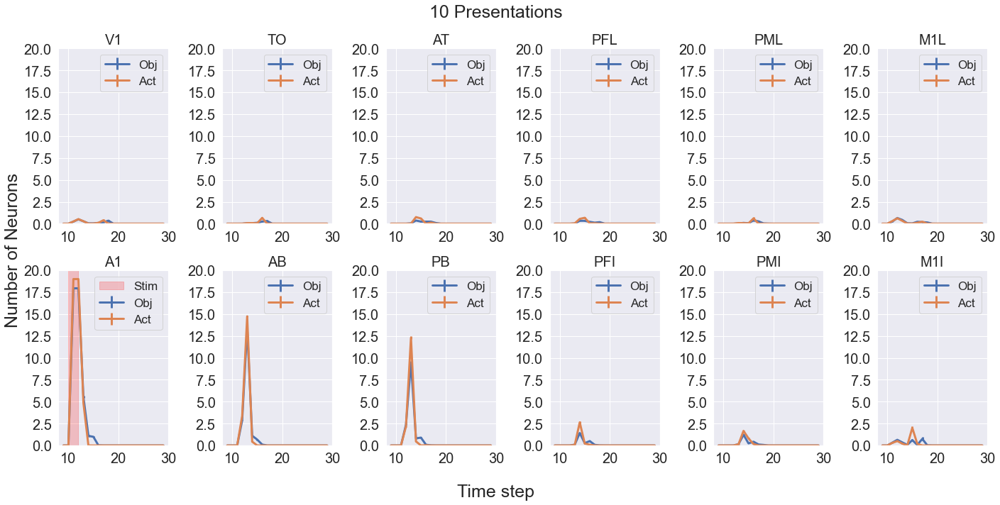

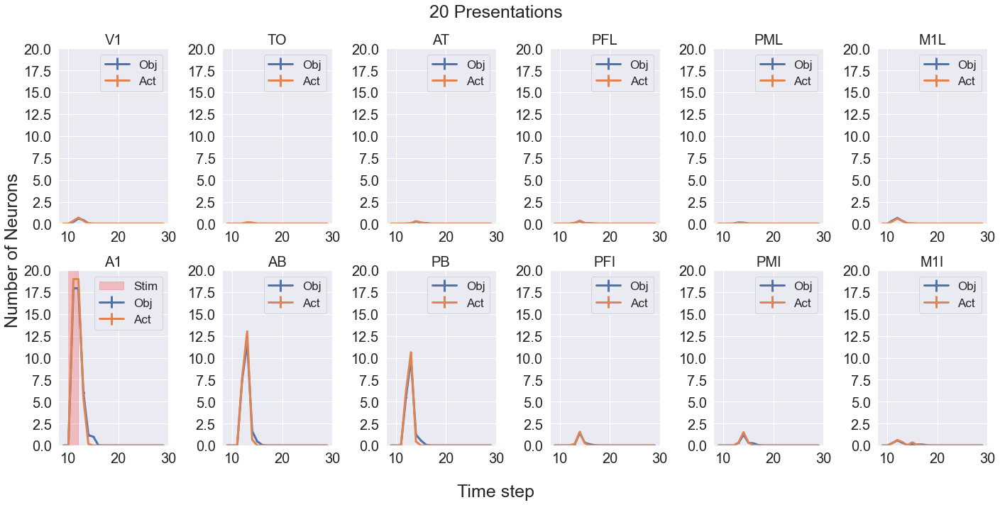

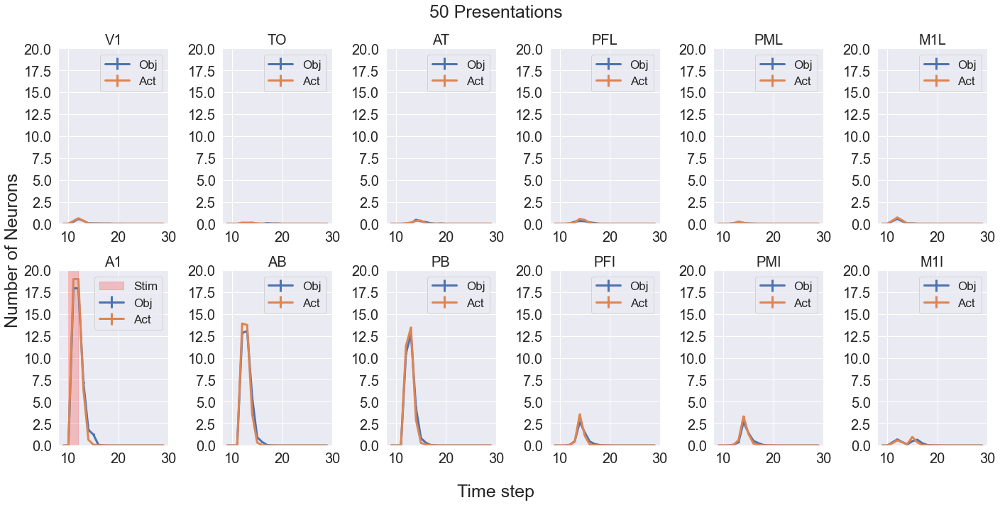

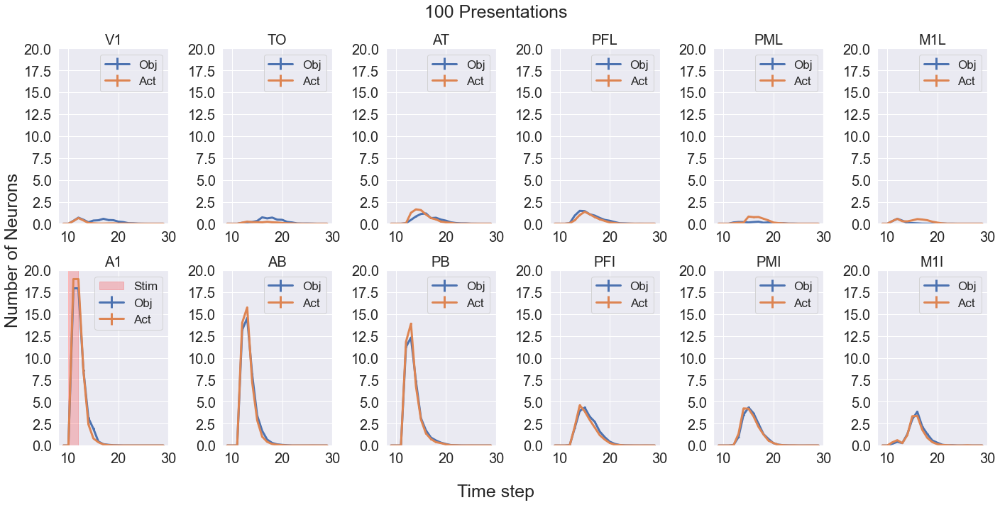

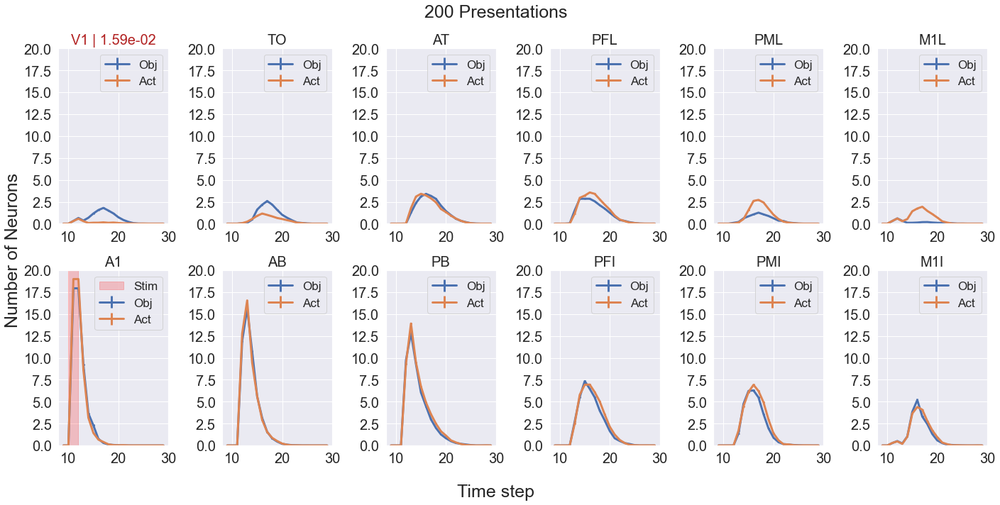

...

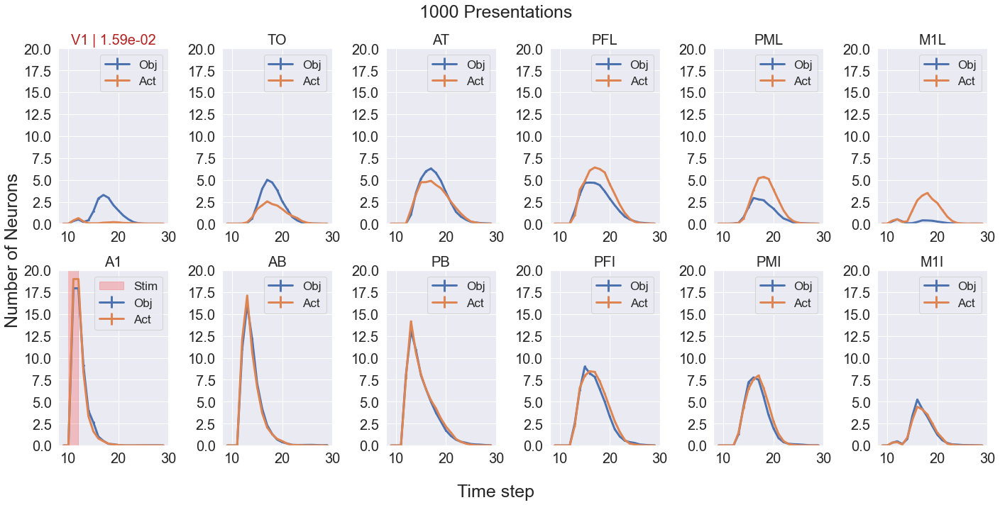

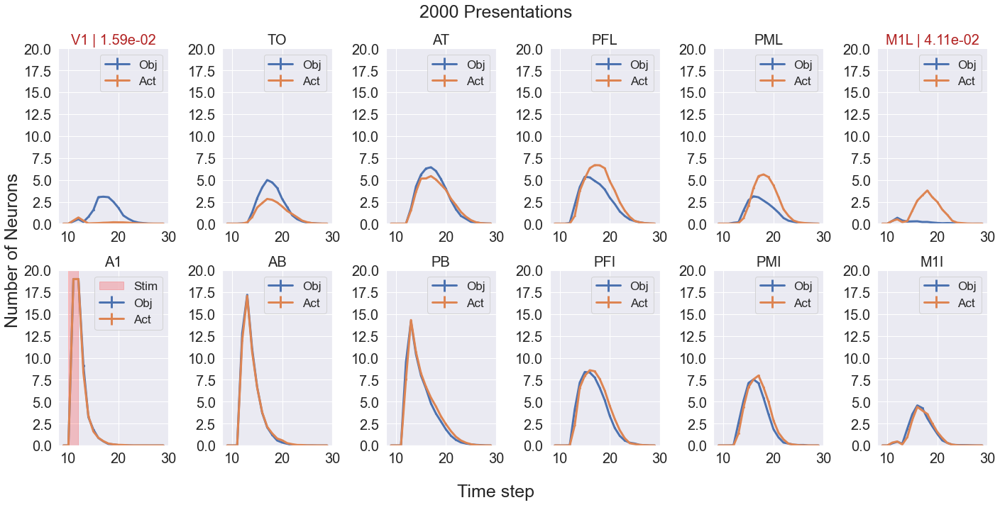

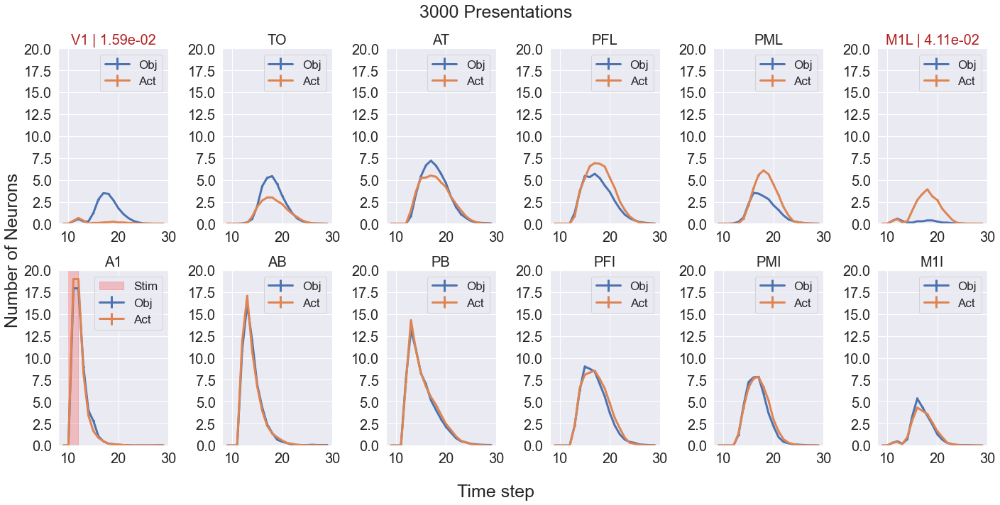

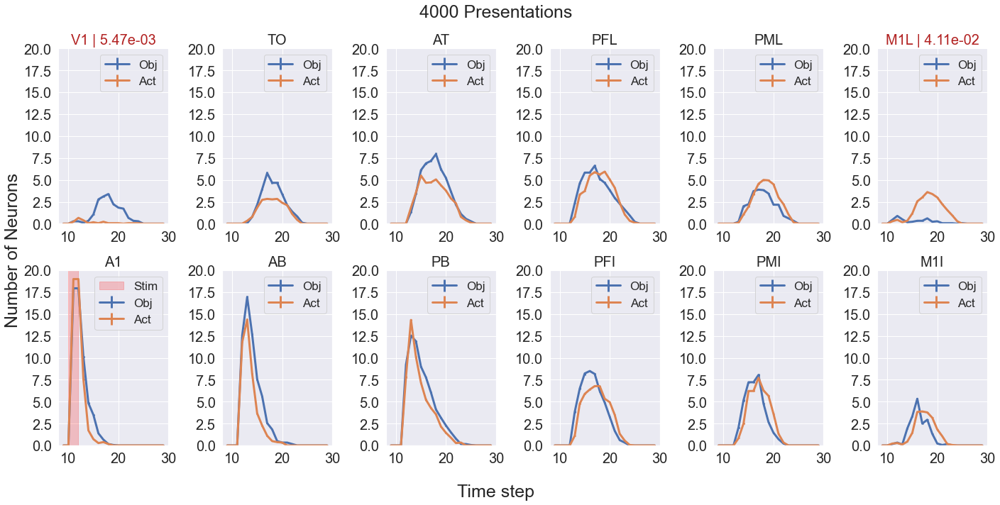

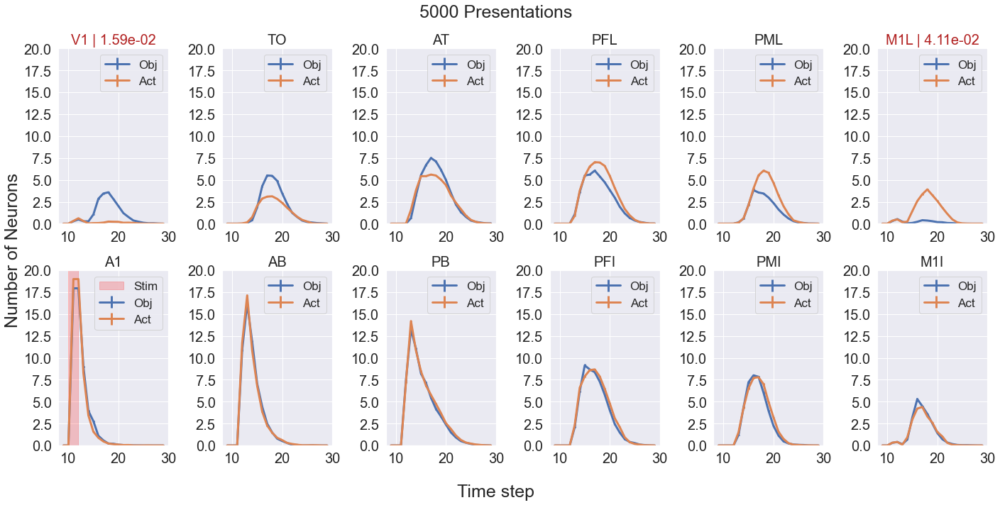

In [1121]:
dfS = read_TCA_order_Area2(directoryS_timecourse_Area, directoryS_order_file)
dfS_mean = dfS.groupby(['stp','Presentation','Specificity']).mean().drop(columns=['stim','patt_no'])
dfS_std = dfS.groupby(['stp','Presentation','Specificity']).std().drop(columns=['stim','patt_no'])
for presentation in dfS_mean.reset_index('Presentation').Presentation.unique():
    plot_TCA_presentation_std(dfS_mean, dfS_std, presentation, nb_network=7)

In [1122]:
def plot_TCA_presentation_std_comparison_CA(df, df_std, 
                                            dfP, dfP_std,
                                            presentation, specificity, nb_network):
    dfP = dfP.xs(presentation,0,'Presentation').xs(specificity,0,'Specificity')
    dfP_std = dfP_std.xs(presentation,0,'Presentation').xs(specificity,0,'Specificity')/(nb_network*6)
    
    df = df.xs(presentation,0,'Presentation').xs(specificity,0,'Specificity')
    df_std = df_std.xs(presentation,0,'Presentation').xs(specificity,0,'Specificity')/(nb_network*6)
    
    font_size_number = 20
    max_ = df.max().max() + 1
    fig, axs= plt.subplots(6, 2)
    for j in range(0, 12):
        rvs = df[df.columns[j]]
        rvsP = dfP[dfP.columns[j]]
        plt.subplot(2,6, (j+1))
        plt.errorbar(dfP[dfP.columns[j]].index, 
                             dfP[dfP.columns[j]], 
                             dfP_std[dfP_std.columns[j]], linewidth = 3,label = 'CA Patt')

        plt.errorbar(df[df.columns[j]].index, 
                             df[df.columns[j]], 
                             df_std[df_std.columns[j]], linewidth = 3,label = 'Total')
        plt.ylim([0, max_])
        plt.xticks(fontsize=font_size_number)
        plt.yticks(fontsize=font_size_number)

        plt.suptitle(str(presentation)+' Presentations  || '+specificity, fontsize=font_size_number+5)
        plt.legend(loc='upper right', fontsize=font_size_number-3)
        fig.supylabel("Number of Neurons",fontsize=font_size_number+5)
        fig.supxlabel("Time step",fontsize=font_size_number+5)

### Difference Activity Total / Activity of CA Pattern showed
#### Action

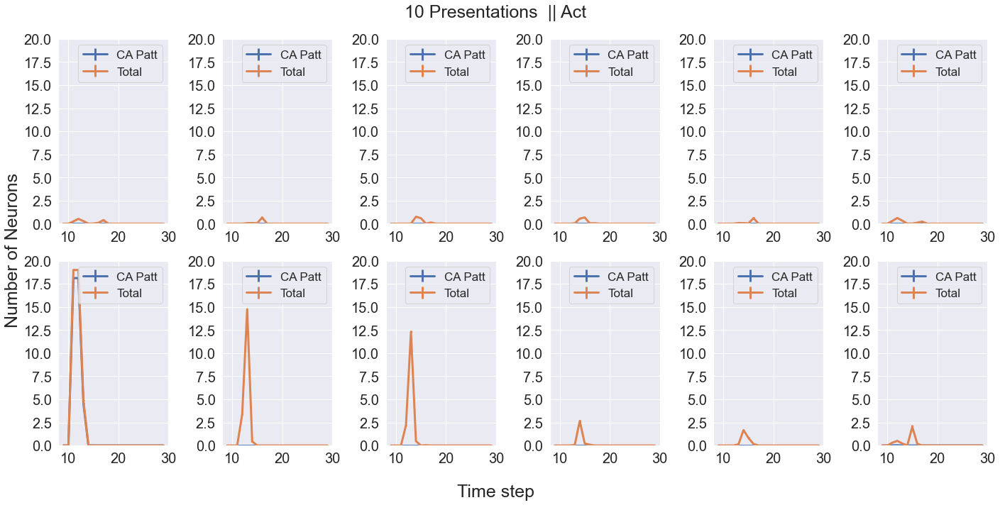

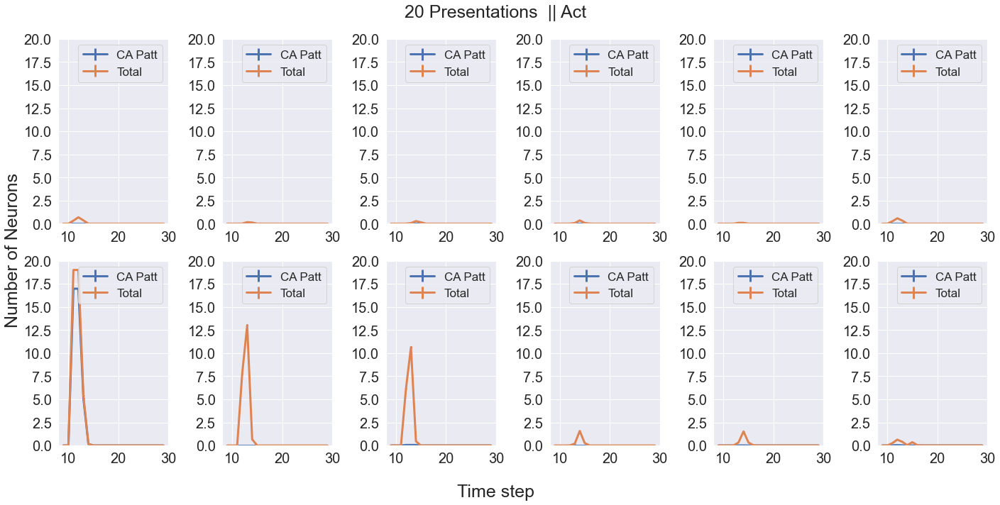

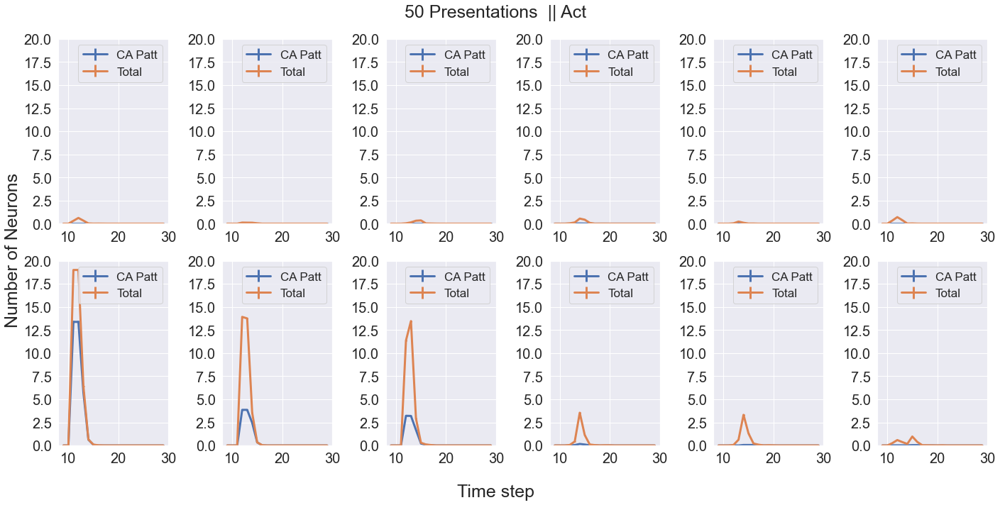

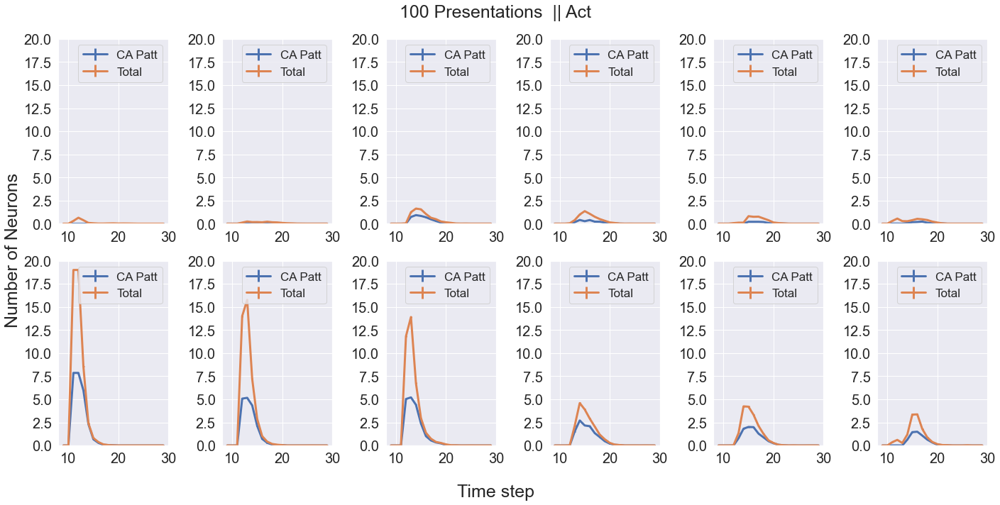

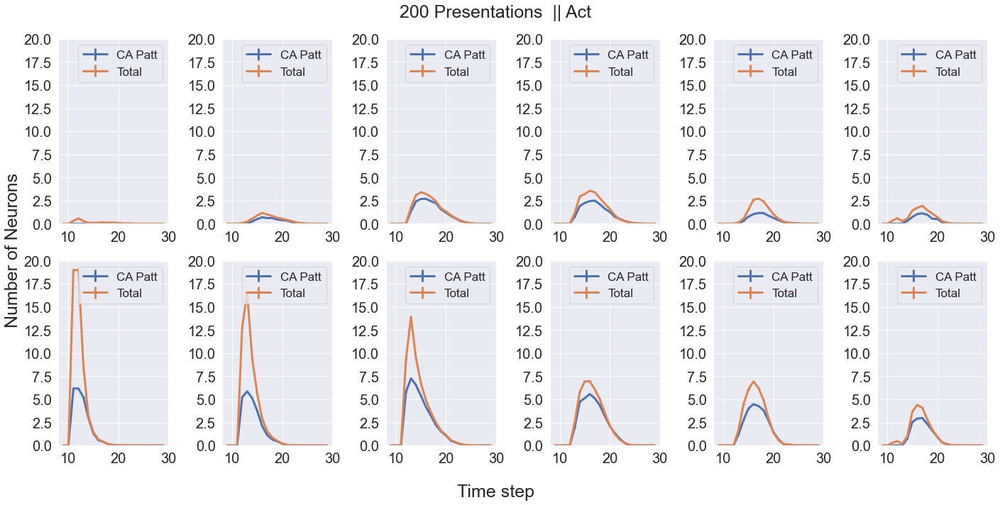

...

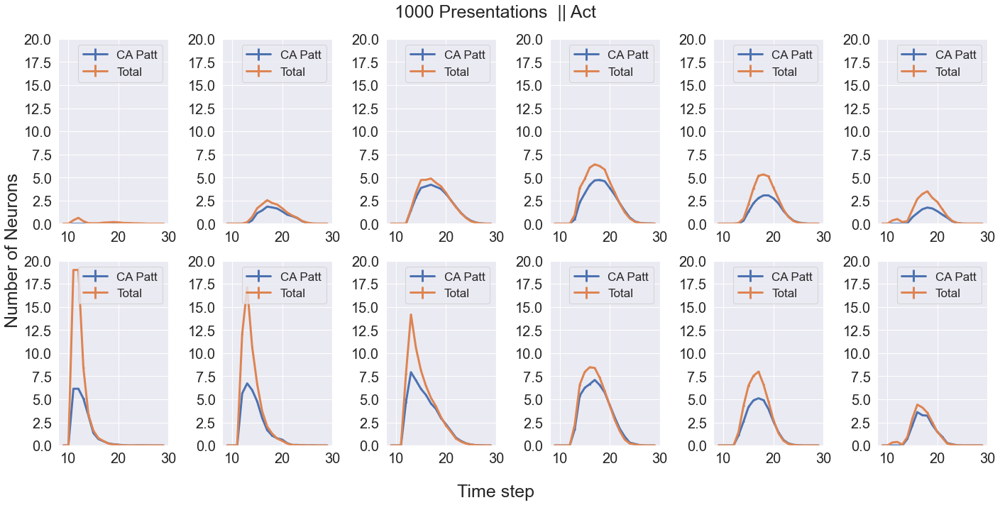

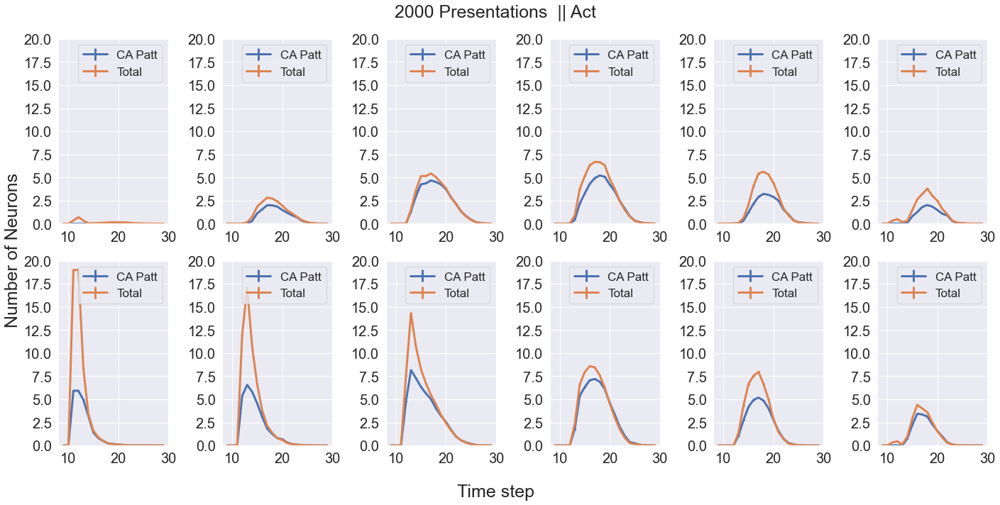

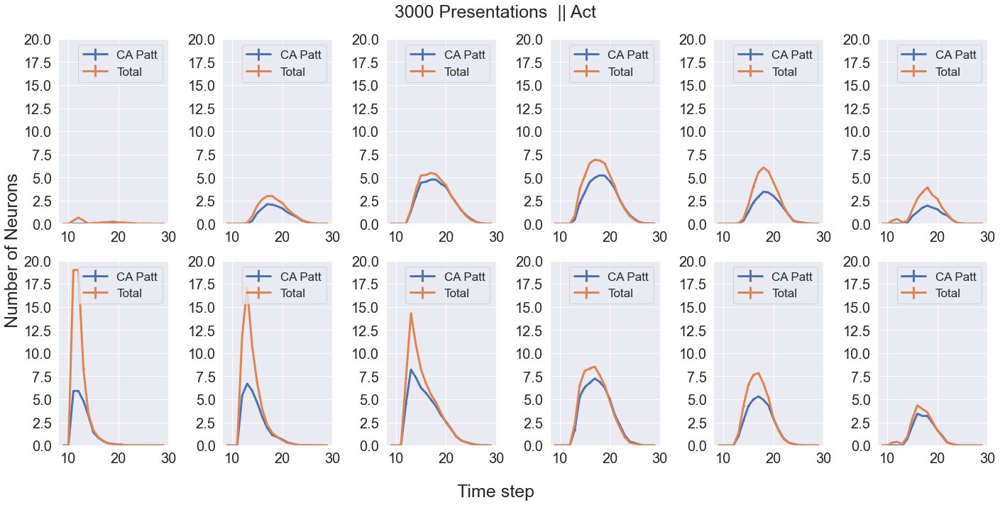

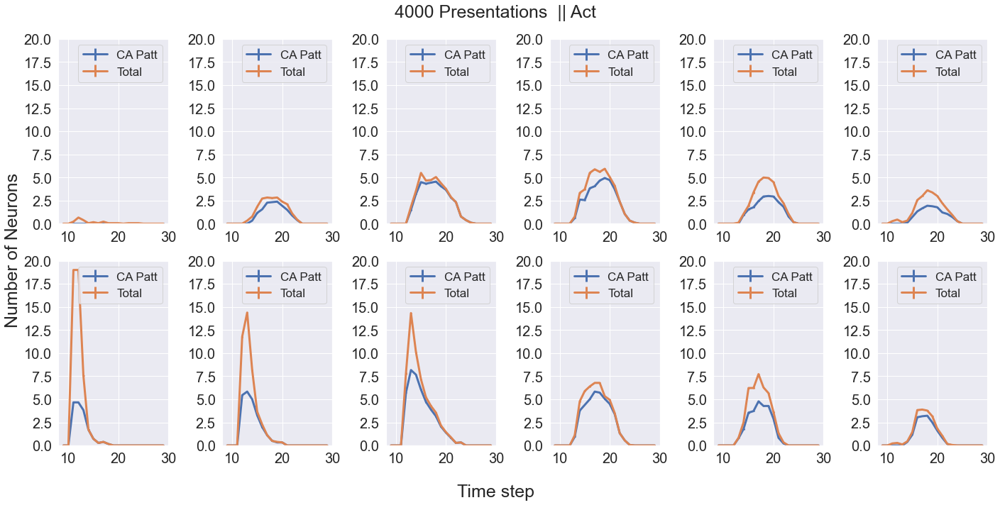

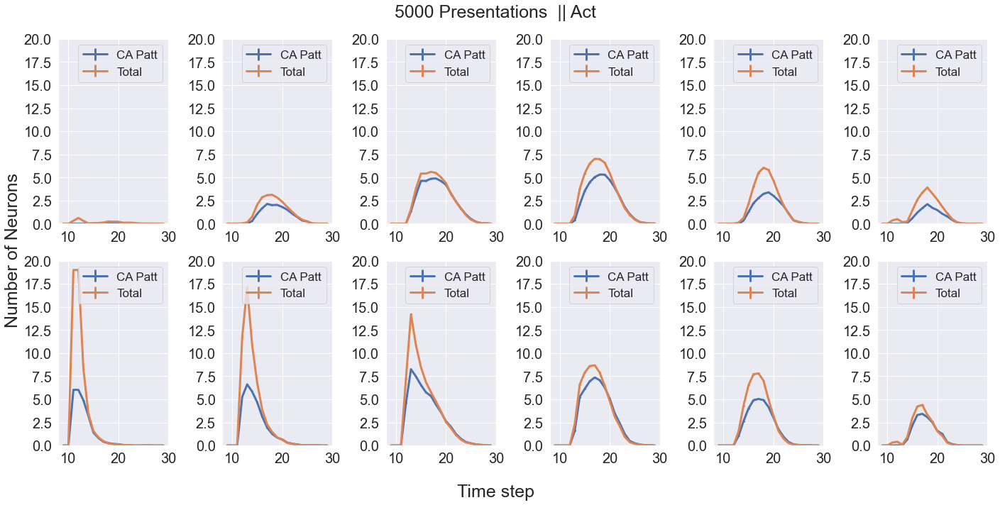

In [1123]:
dfP_mean , dfP_std = TCA_ca_patt(dfS_patt)
for presentation in dfS_mean.reset_index('Presentation').Presentation.unique():
    plot_TCA_presentation_std_comparison_CA(dfS_mean, dfS_std, dfP_mean, dfP_std, presentation,'Act', 7)

#### Object

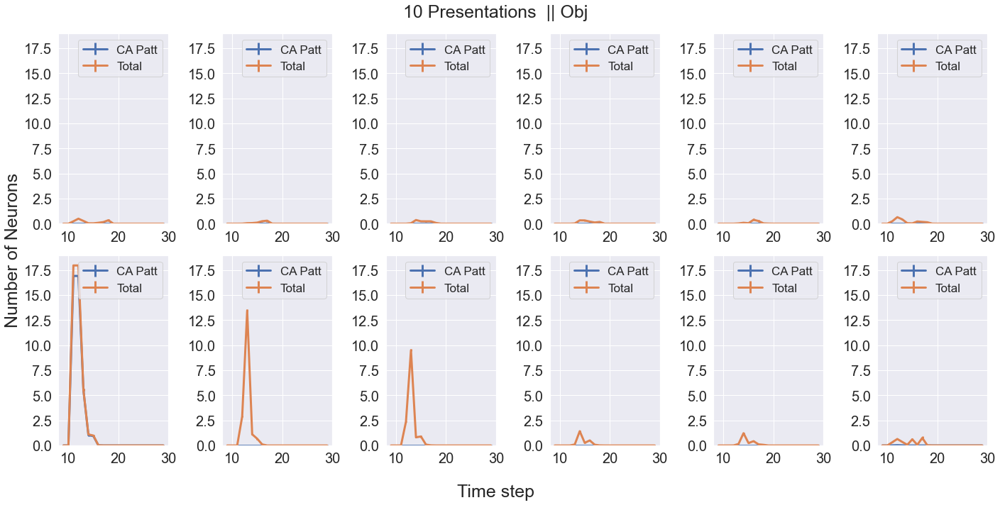

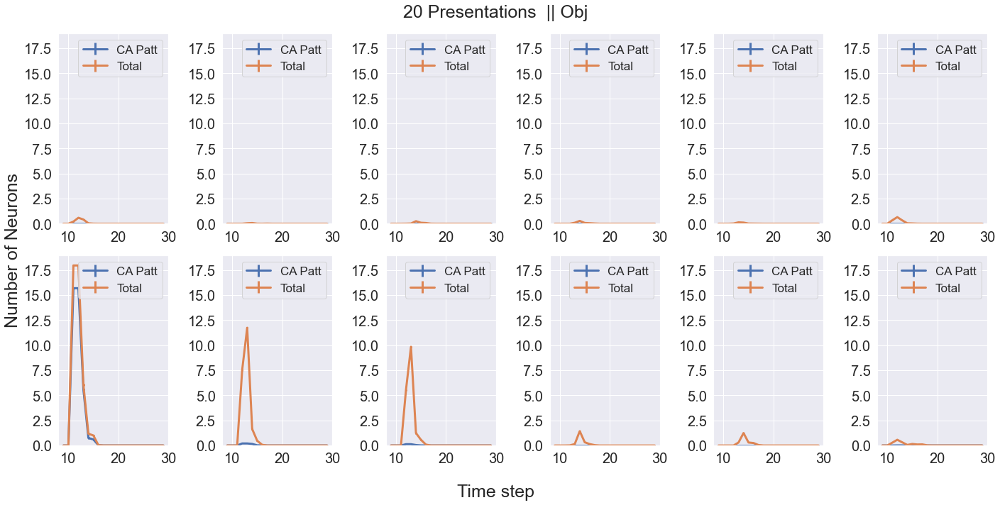

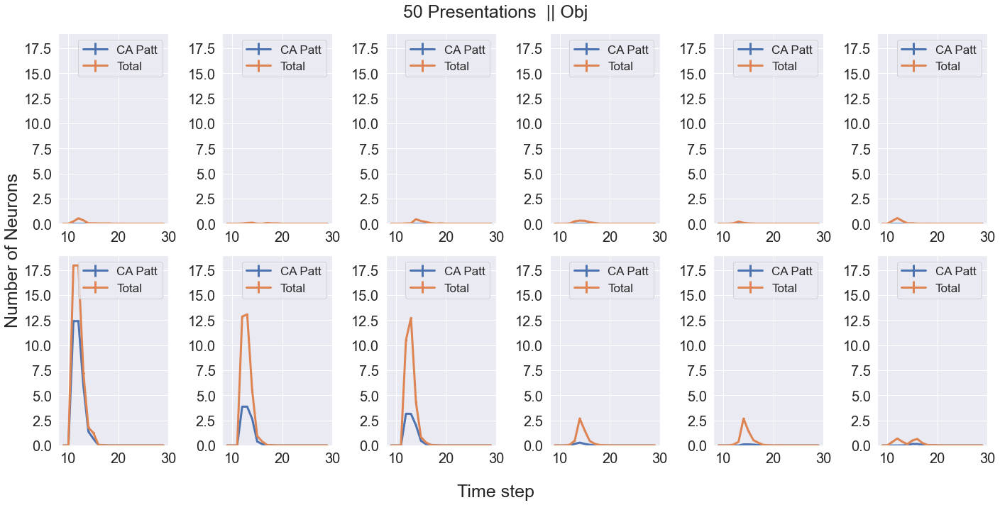

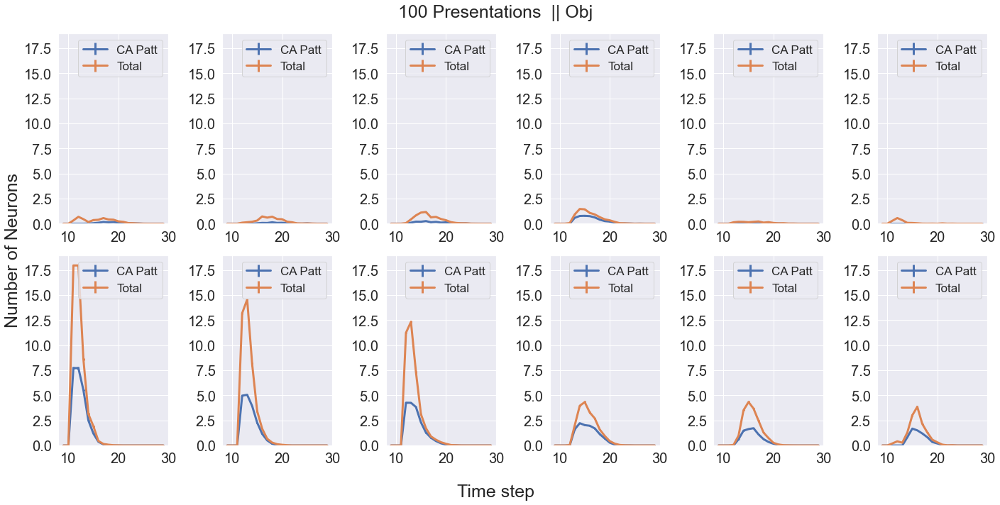

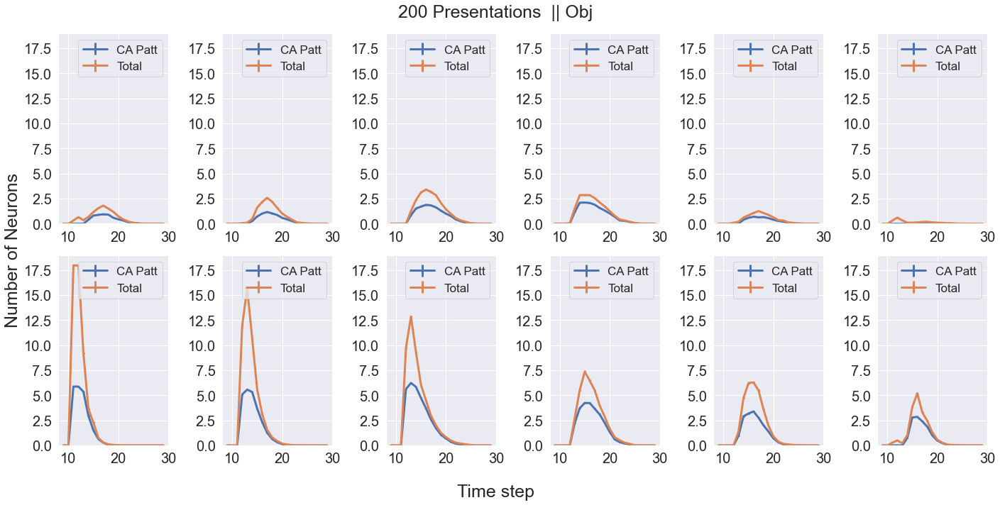

...

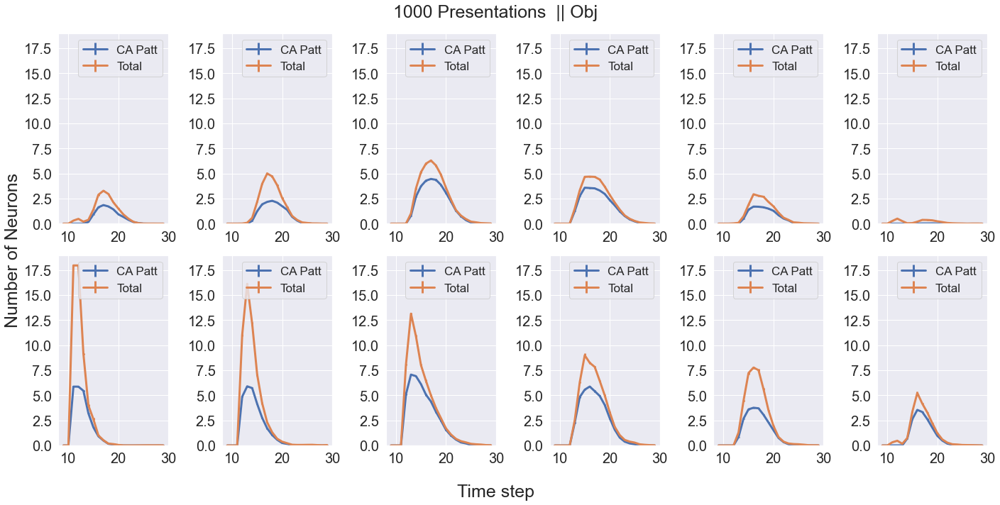

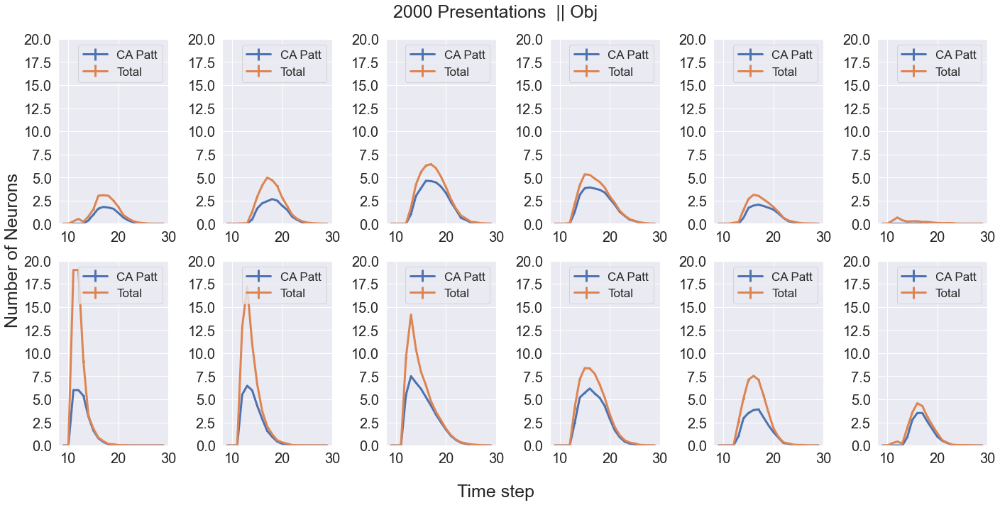

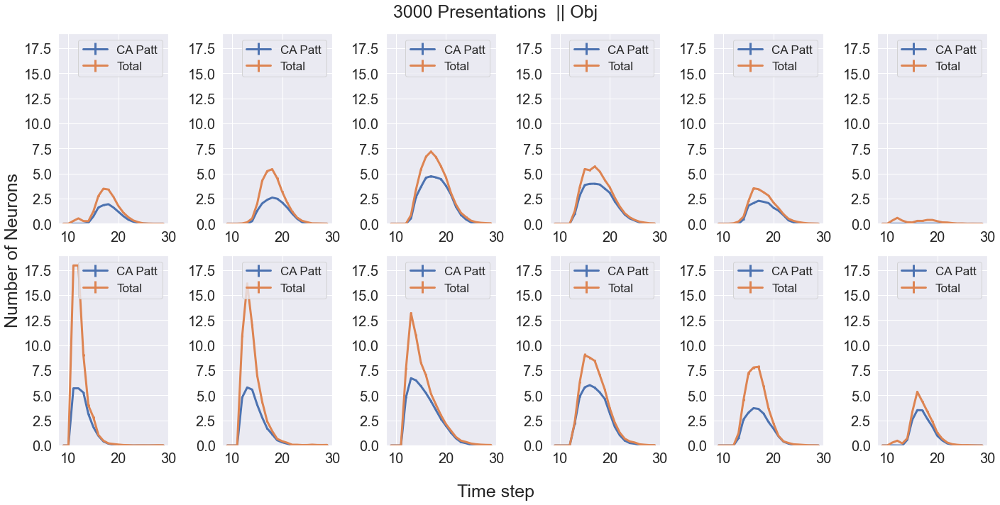

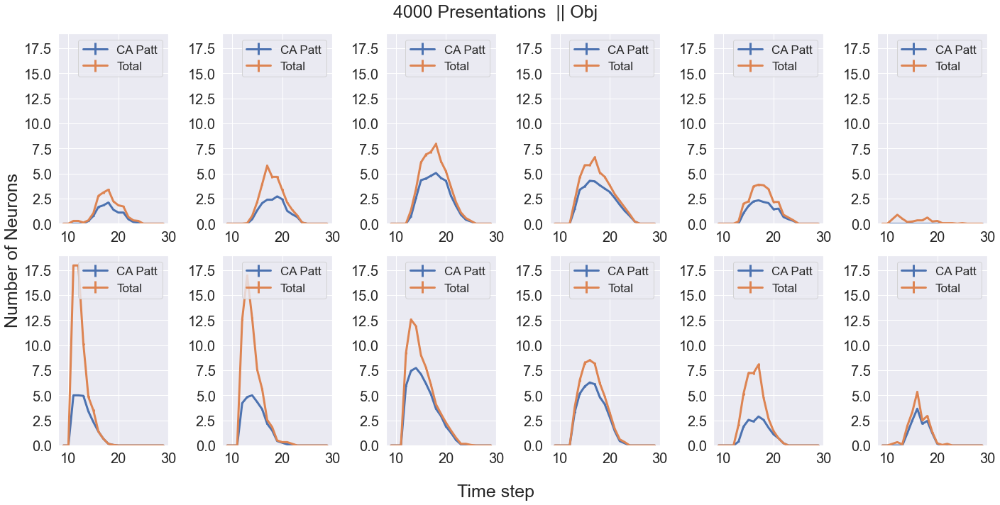

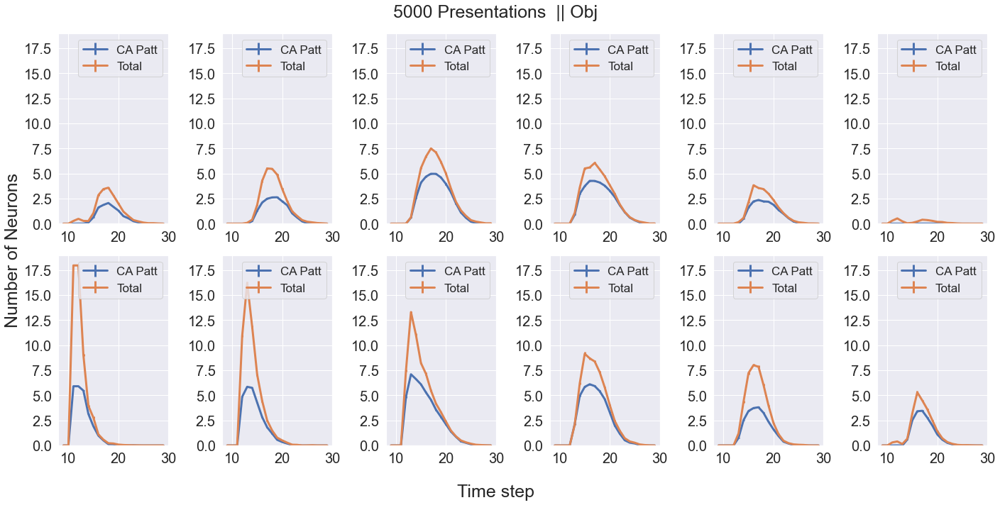

In [1124]:
dfP_mean , dfP_std = TCA_ca_patt(dfS_patt)
for presentation in dfS_mean.reset_index('Presentation').Presentation.unique():
    plot_TCA_presentation_std_comparison_CA(dfS_mean, dfS_std, dfP_mean, dfP_std, presentation,'Obj', 7)

### All Area TCA
#### Action

In [1131]:
def plot_all_areas_TCA(df, df_std,  presentation, specificity, nb_network):
    font_size_number = 20
    df = df.xs(presentation, 0,'Presentation').xs(specificity,0,'Specificity')
    df_std = df_std.xs(presentation, 0,'Presentation').xs(specificity,0,'Specificity')/(nb_network*6)
    max_ = df.max().max() + 0.5
    fig, axs = plt.subplots(2,1)
    plt.subplot(211)
    for i in range(0,6):
        plt.errorbar(df[df.columns[i]].index, 
                                 df[df.columns[i]], 
                                 df_std[df_std.columns[i]], linewidth = 3,label =df.columns[i])
    plt.legend(fontsize=font_size_number)
    plt.ylim([0, max_])
    plt.xticks(fontsize=font_size_number)
    plt.yticks(fontsize=font_size_number)
    plt.subplot(212)
    for i in range(6,12):
        plt.errorbar(df[df.columns[i]].index, 
                                 df[df.columns[i]], 
                                 df_std[df_std.columns[i]], linewidth = 3,label =df.columns[i])
    plt.suptitle(str(presentation)+' Presentation   |    '+specificity, fontsize=font_size_number+5)
    plt.axvspan(10, 12, alpha=0.2, color='red', label = 'Stimulation A1')
    plt.legend(fontsize=font_size_number)
    plt.ylim([0, max_])
    plt.xticks(fontsize=font_size_number)
    plt.yticks(fontsize=font_size_number)
    fig.supylabel("Number of Neurons",fontsize=font_size_number+5)
    fig.supxlabel("Time step",fontsize=font_size_number+5)

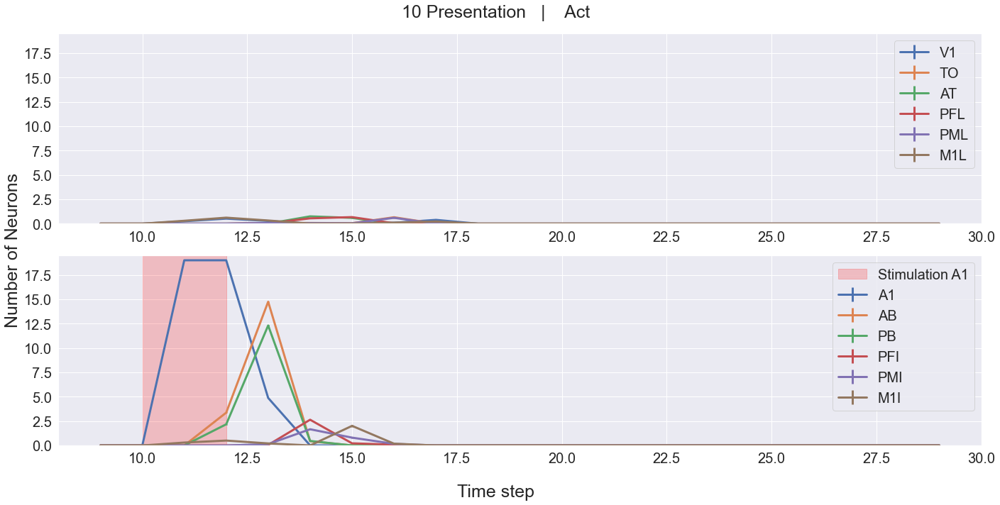

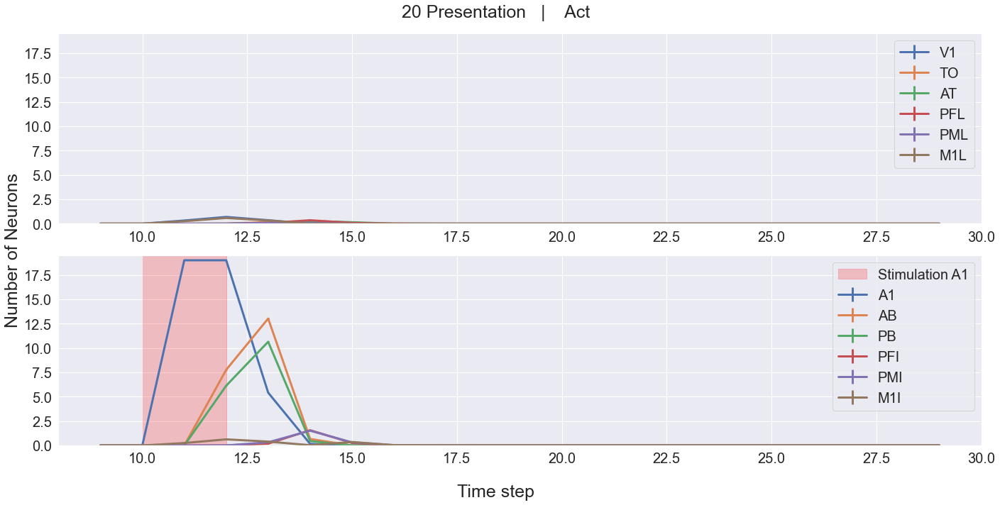

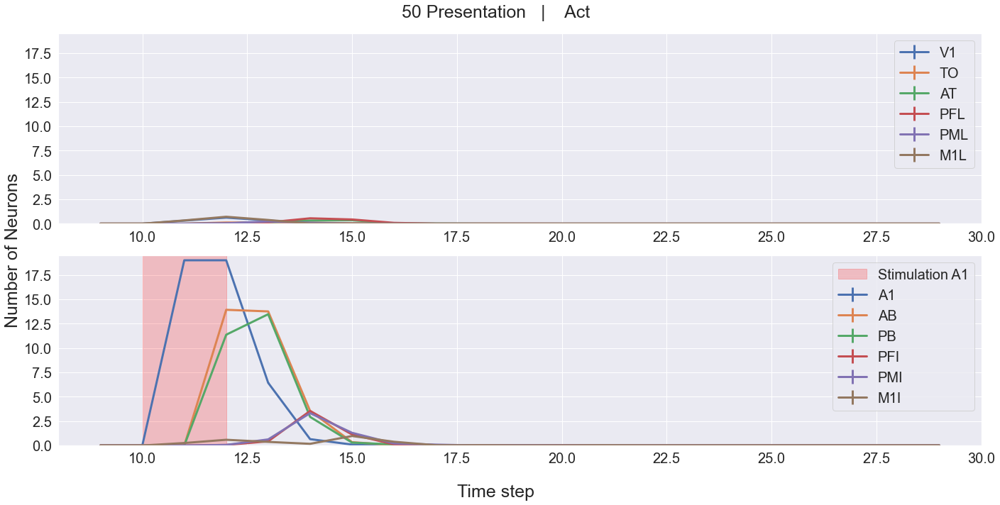

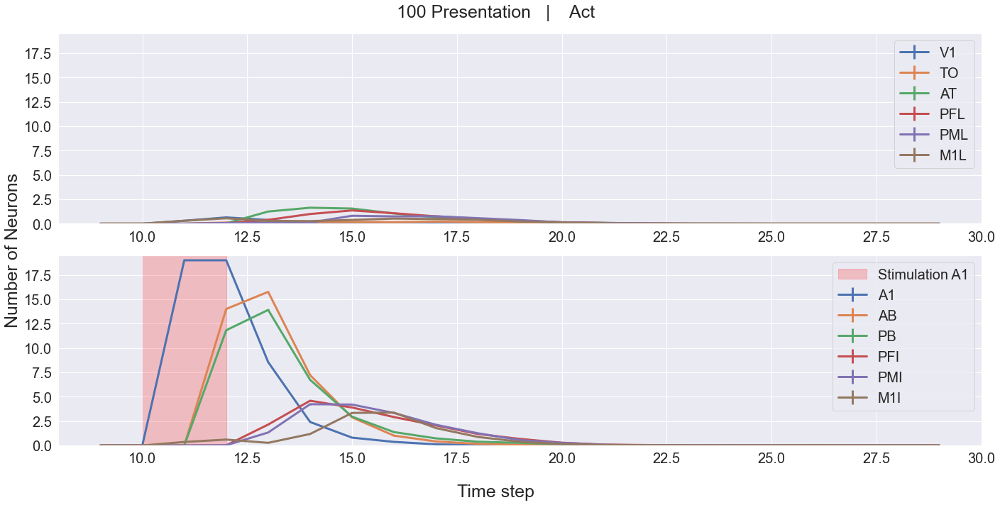

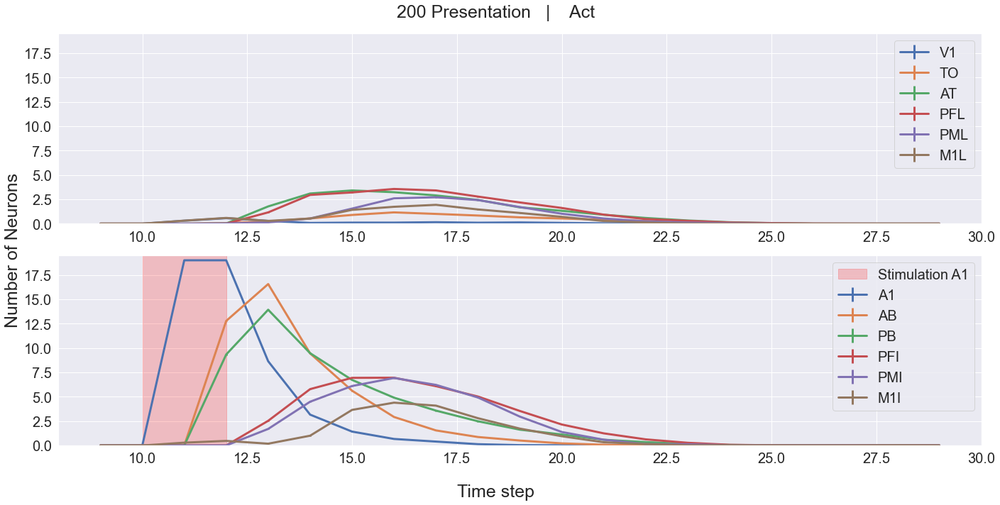

...

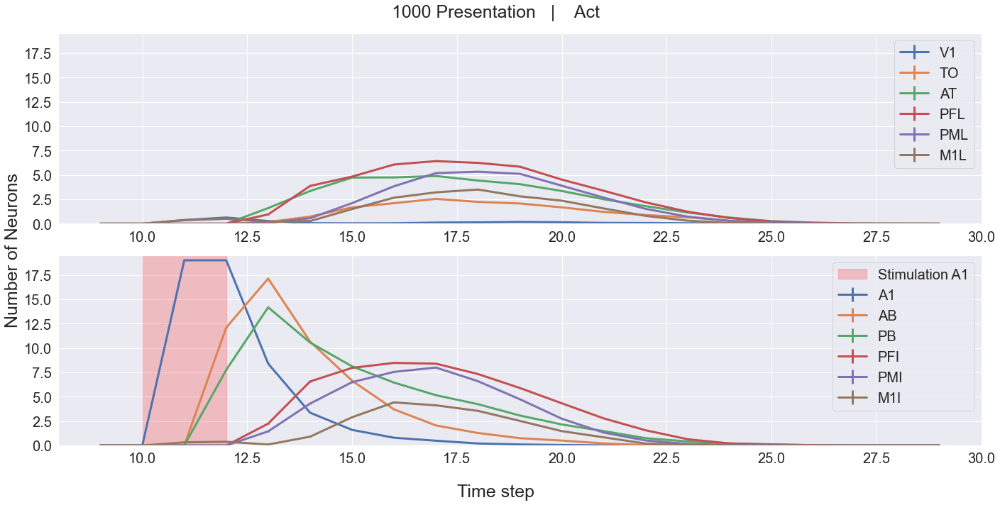

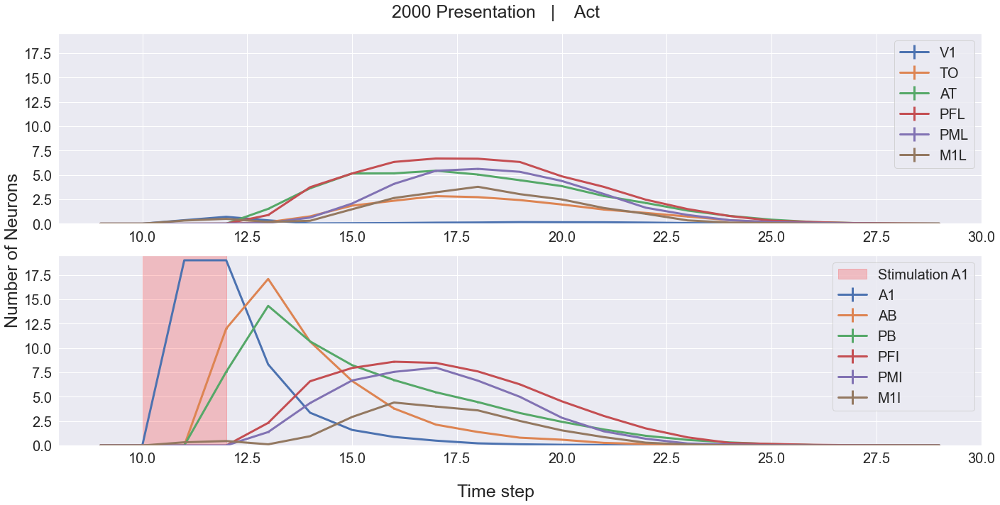

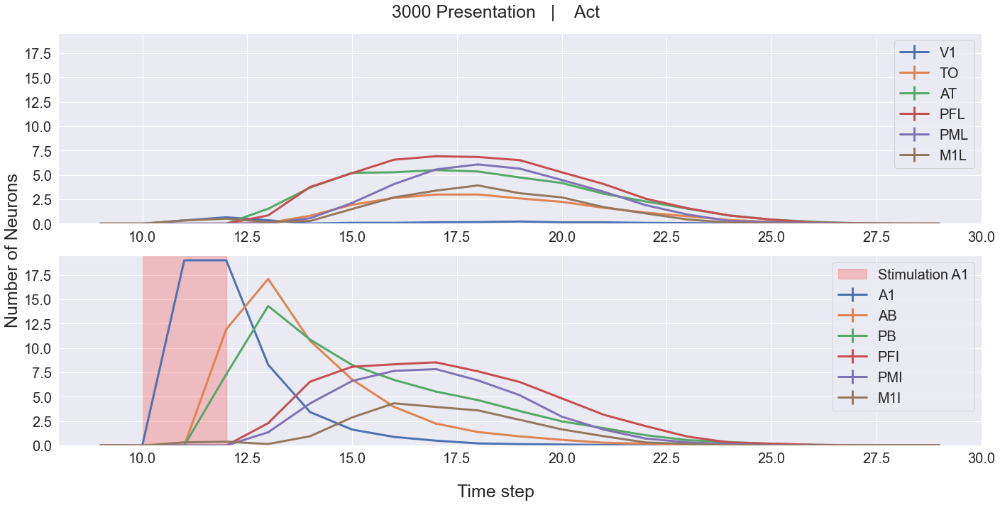

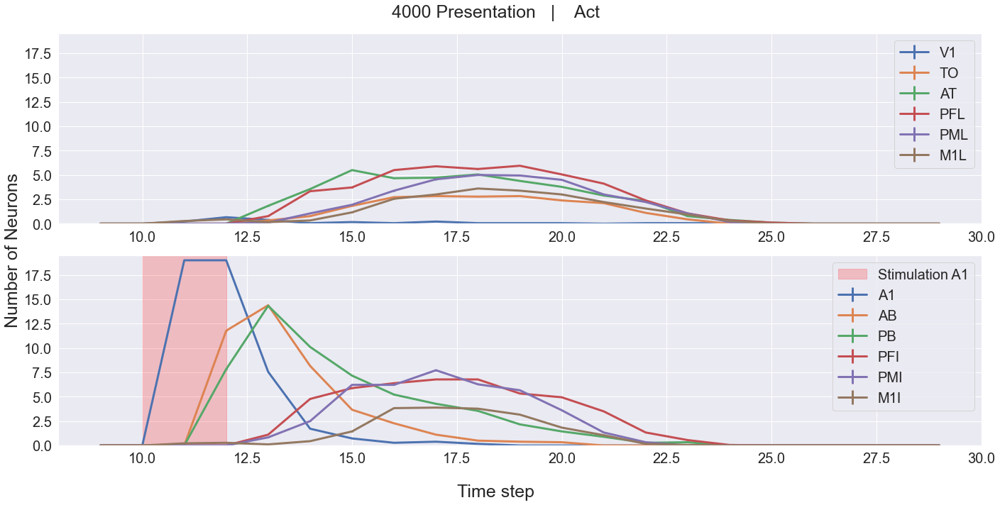

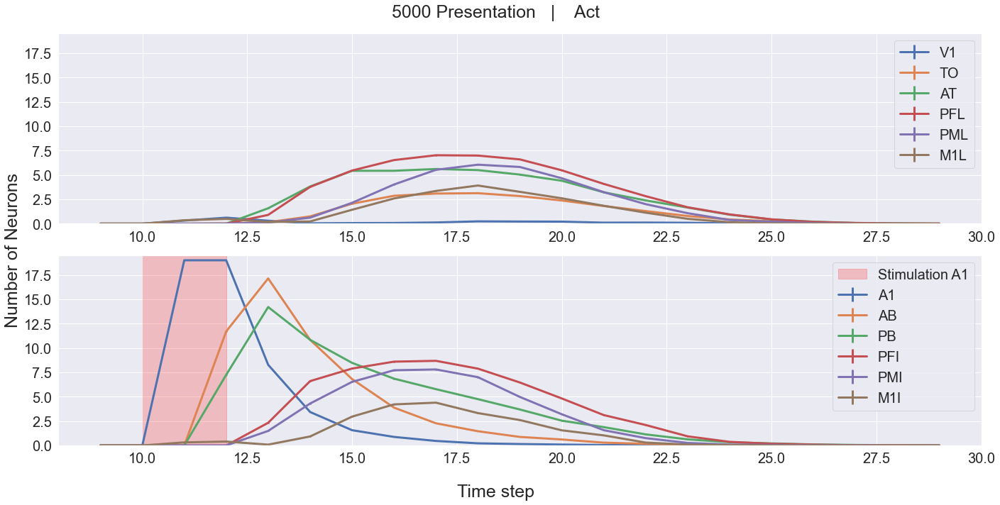

In [1134]:
for presentation in dfS_mean.reset_index('Presentation').Presentation.unique():
    plot_all_areas_TCA(dfS_mean, dfS_std, presentation, 'Act', 12)

#### Object

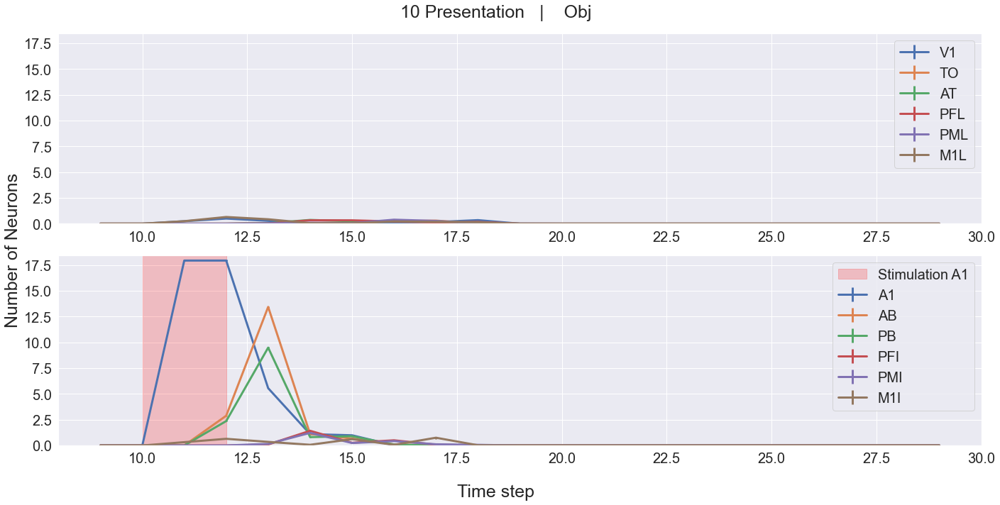

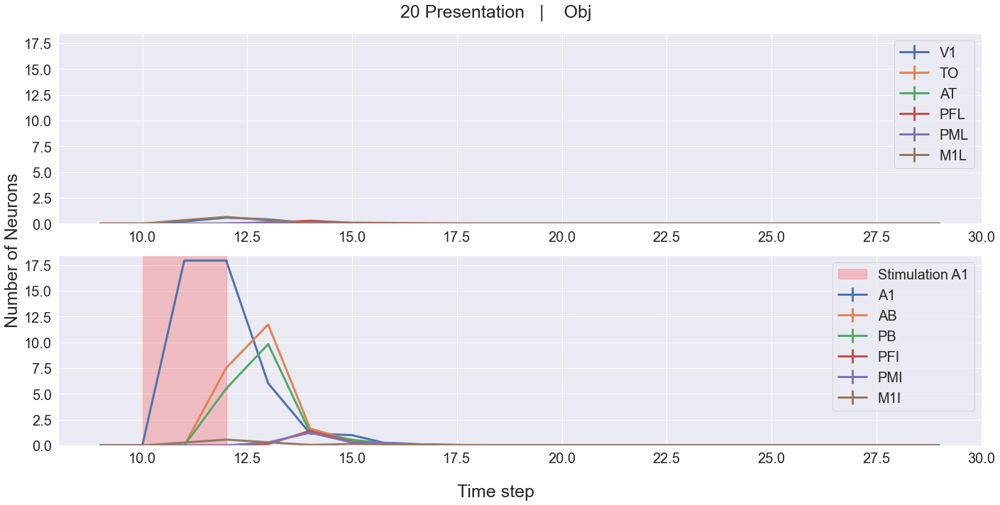

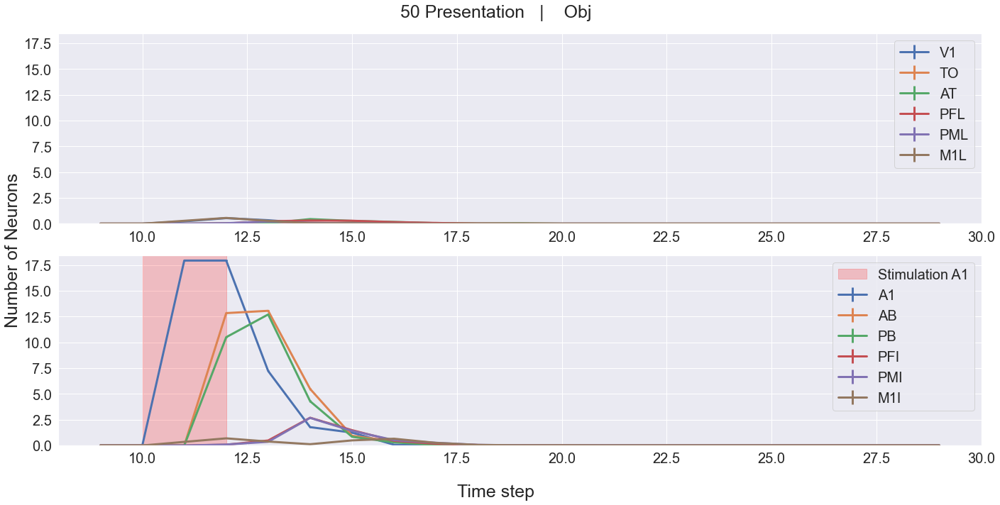

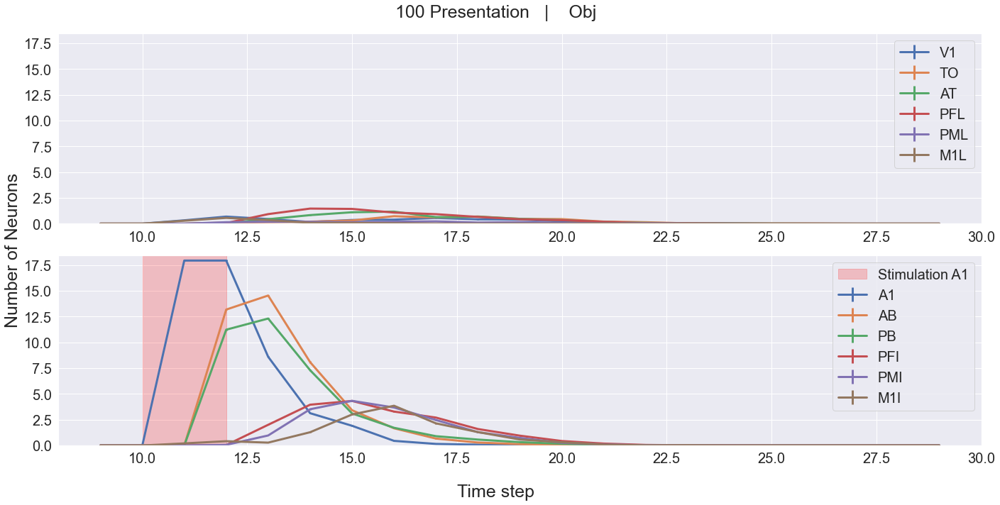

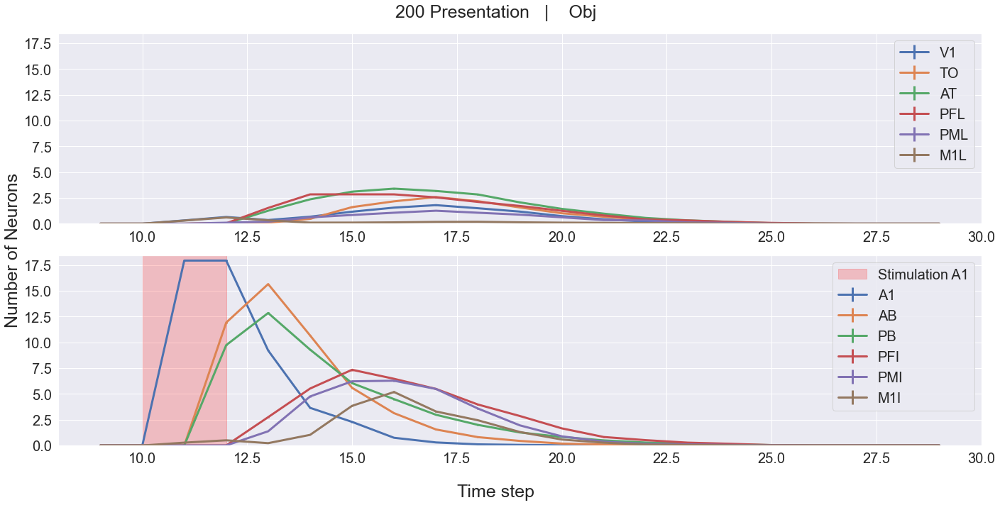

...

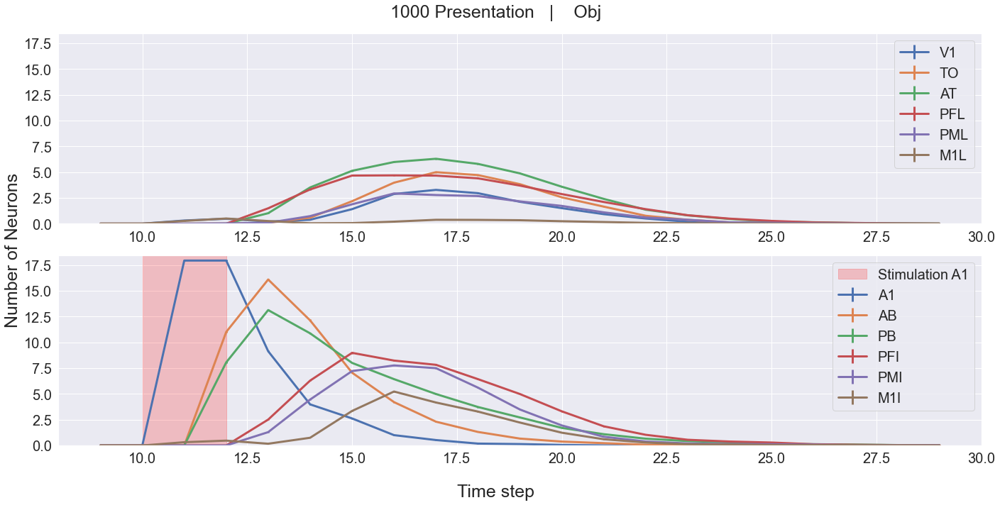

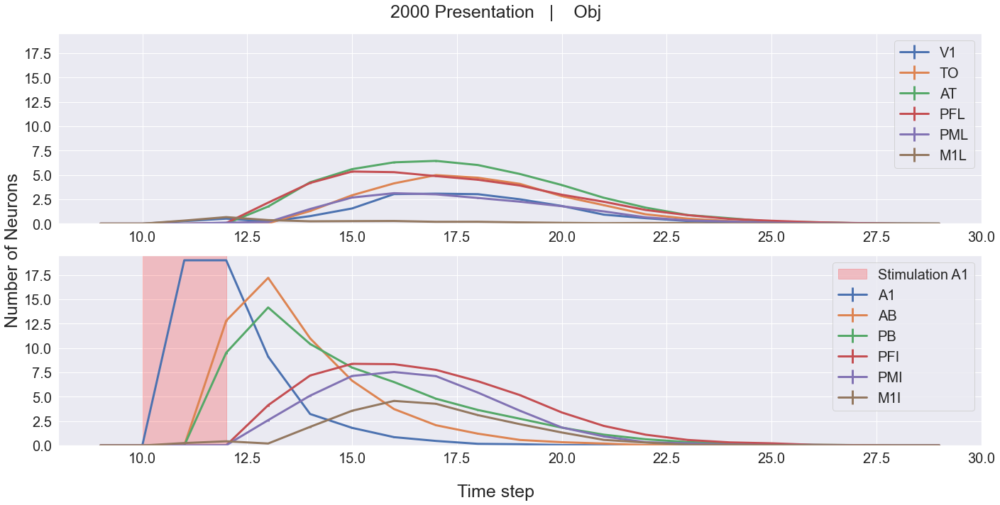

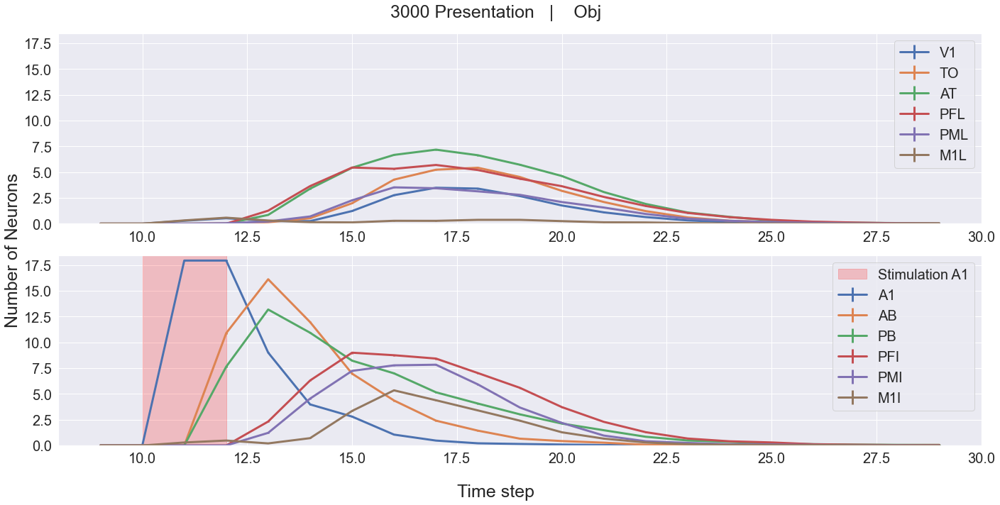

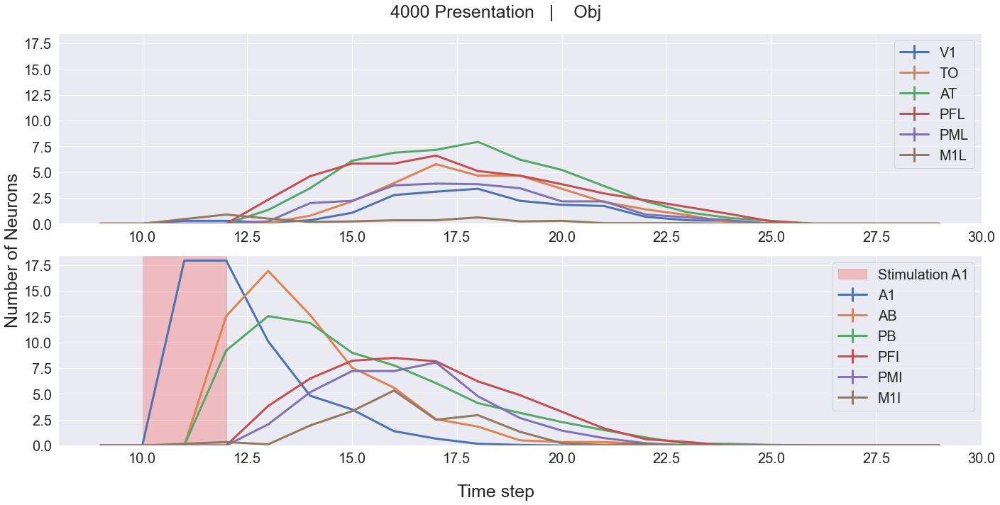

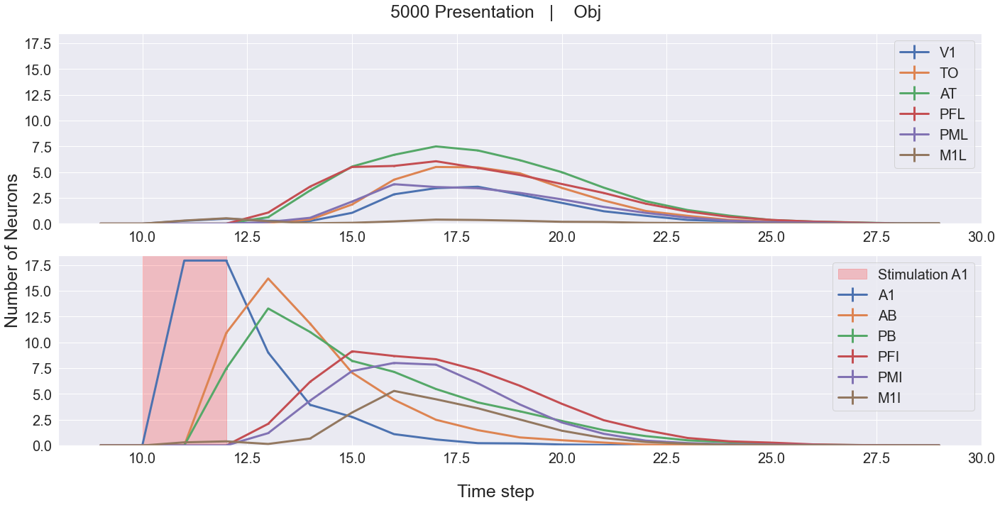

In [1135]:
for presentation in dfS_mean.reset_index('Presentation').Presentation.unique():
    plot_all_areas_TCA(dfS_mean, dfS_std, presentation, 'Obj', 12)

### System Area TCA

In [1158]:
def macro_area(mean_total_act):
    visual = mean_total_act.iloc[:,0:3].mean(1)
    motor = mean_total_act.iloc[:,3:6].mean(1)
    auditory = mean_total_act.iloc[:,6:9].mean(1)
    articulatory = mean_total_act.iloc[:,9:12].mean(1)
    macro_areas = pd.concat([visual, motor, auditory,articulatory],1)
    macro_areas.columns = ['Visual', 'Motor', 'Auditory', 'Articulatory']
    return macro_areas

def plot_all_system_TCA(df, df_std,  presentation, nb_network):
    font_size_number = 20
    df_act = df.xs(presentation, 0,'Presentation').xs('Act',0,'Specificity')
    df_std_act = df_std.xs(presentation, 0,'Presentation').xs('Act',0,'Specificity')/(nb_network*6)
    df_obj = df.xs(presentation, 0,'Presentation').xs('Obj',0,'Specificity')
    df_std_obj = df_std.xs(presentation, 0,'Presentation').xs('Obj',0,'Specificity')/(nb_network*6)
    max_ = df.max().max() + 0.5
    fig, axs = plt.subplots(2,1)
    plt.subplot(211)
    for i in range(0,4):
        plt.errorbar(df_act[df_act.columns[i]].index, 
                                 df_act[df_act.columns[i]], 
                                 df_std_act[df_std_act.columns[i]], linewidth = 3,label =df.columns[i])
    plt.axvspan(10, 12, alpha=0.2, color='red', label = 'Stimulation A1')
    plt.legend(fontsize=font_size_number)
    plt.ylim([0, max_])
    plt.xticks(fontsize=font_size_number)
    plt.yticks(fontsize=font_size_number)
    plt.title('Act', fontsize=font_size_number)
    plt.subplot(212)
    for i in range(0,4):
        plt.errorbar(df_obj[df_obj.columns[i]].index, 
                                 df_obj[df_obj.columns[i]], 
                                 df_std_obj[df_std_obj.columns[i]], linewidth = 3,label =df.columns[i])
    plt.suptitle(str(presentation)+' Presentation ', fontsize=font_size_number+5)
    plt.title('Obj', fontsize=font_size_number)
    plt.axvspan(10, 12, alpha=0.2, color='red', label = 'Stimulation A1')
    plt.legend(fontsize=font_size_number)
    plt.ylim([0, max_])
    plt.xticks(fontsize=font_size_number)
    plt.yticks(fontsize=font_size_number)
    fig.supylabel("Number of Neurons",fontsize=font_size_number+5)
    fig.supxlabel("Time step",fontsize=font_size_number+5)

#### Curve

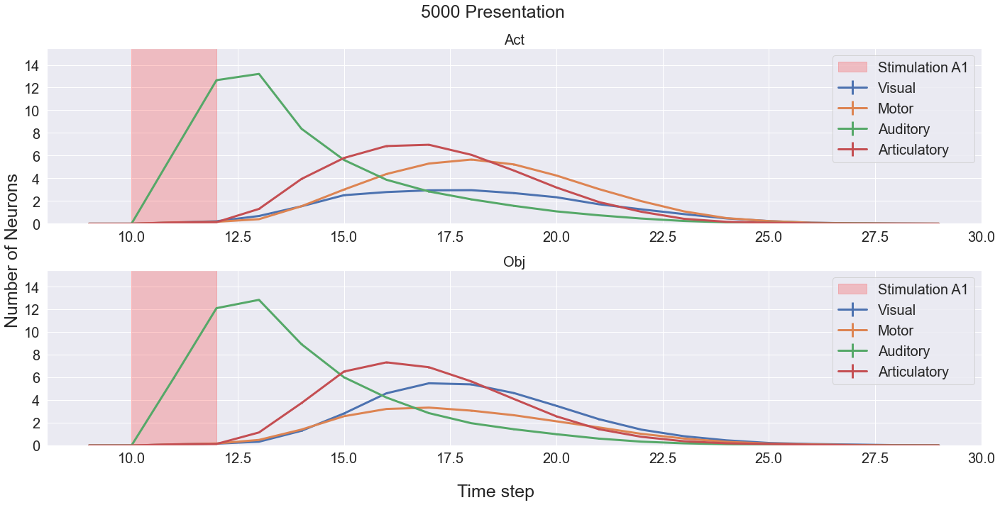

In [1160]:

plot_all_system_TCA(macro_area(dfS_mean), macro_area(dfS_std), presentation, 12)

### Max stp
#### Box plot

In [1291]:
def get_max_index1(dfS_mean):
    max_stpS = []
    presentationS = []
    dfS_max = dfS_mean.max()#.xs(specificity,0,'Specificity').xs(presentation,0,'Presentation').max()
    dfS_max[dfS_max<1]=0
    df_mean_spe = dfS_mean#.xs(specificity,0,'Specificity').xs(presentation,0,'Presentation')
    max_stp = []
    for area in dfS_max.index:
        max_stp.append(df_mean_spe[df_mean_spe==dfS_max][area].dropna().index[0])
    max_stp = pd.DataFrame(max_stp, index=dfS_max.index)#, columns=[presentation])
    max_stpS.append(max_stp)
    return pd.concat(max_stpS,1)



In [1292]:
def get_all_max(df_test, presentation, specificity):

    df_eph1 = df_test.xs(presentation,0,'Presentation').xs(specificity,0,'Specificity')

    total_max = []
    for network in df_test.reset_index().Network.unique():
        for stimulation in df_test.reset_index().stim.unique():
            df_eph2 = df_eph1.xs(network,0,'Network').xs(stimulation,0,'stim')
            total_max.append(get_max_index1(df_eph2))

    total_maxS = pd.concat(total_max).reset_index()
    total_maxS.columns=['Area','Max stp']
    total_maxS['Specificity']=specificity
    #total_maxS.columns = [k for k in range(0, len(total_maxS.T))]
    return total_maxS

In [1293]:
presentation =5000

df_test = dfS.groupby(['Specificity','Network','Presentation', 'stp', 'stim']).mean().drop(columns=['patt_no'])
max_act = get_all_max(df_test, presentation, 'Act')
max_obj = get_all_max(df_test, presentation, 'Obj')
data_max = pd.concat([max_act, max_obj])
data_max

,Area,Max stp,Specificity
0,V1,9,Act
1,TO,18,Act
2,AT,16,Act
3,PFL,19,Act
4,PML,18,Act
...,...,...,...
427,AB,13,Obj
428,PB,13,Obj
429,PFI,16,Obj
430,PMI,16,Obj


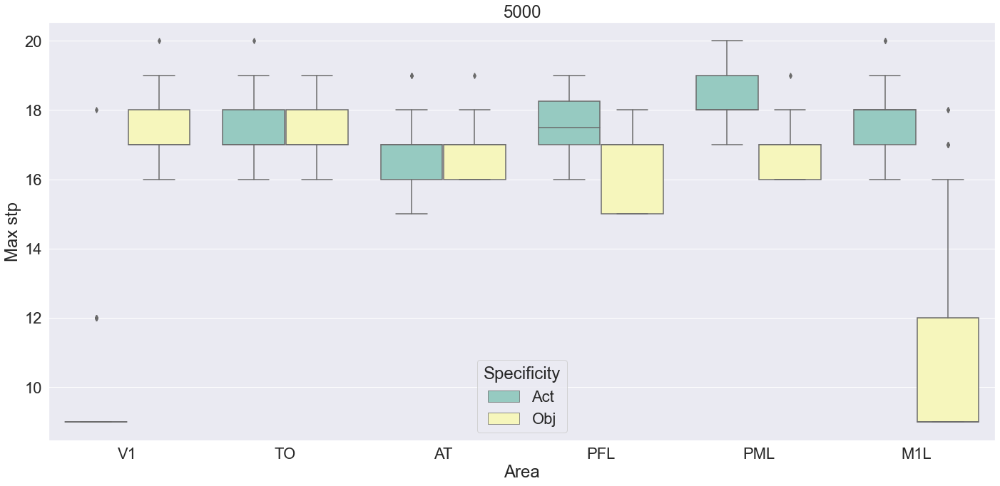

Text(0.5, 1.0, '5000')

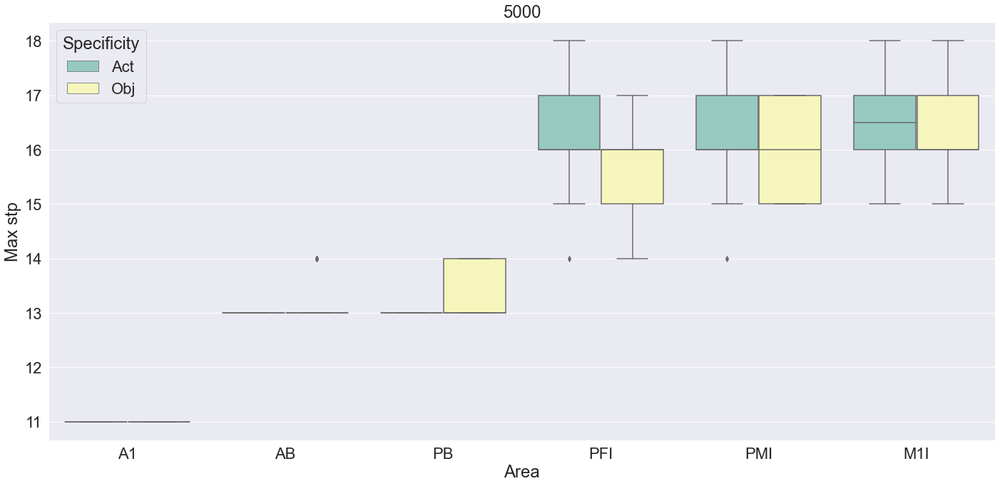

In [1297]:
part_1 = data_max.loc[data_max.apply(lambda x: x.Area in data_max.Area.unique()[0:6], axis=1)]
part_2 = data_max.loc[data_max.apply(lambda x: x.Area in data_max.Area.unique()[6:], axis=1)]

sns.set(font_scale = 2)
tips = sns.load_dataset("tips")
ax = sns.boxplot(x="Area", y="Max stp", hue="Specificity", data=part_1, palette="Set3")
plt.title(str(presentation))
plt.show()

tips = sns.load_dataset("tips")
ax = sns.boxplot(x="Area", y="Max stp", hue="Specificity", data=part_2, palette="Set3")
plt.title(str(presentation))

# Test DON'T LOOK AFTER THAT

==> this is just trial codes don't look it

## Maximum TCA Area

In [1125]:
dfS = read_TCA_order_Area2(directoryS_timecourse_Area, directoryS_order_file)
dfS

stim  stp  patt_no   V1   TO    AT   PFL  \
Specificity Network Presentation                                             
Obj         0       2000             1    9        1  0.0  0.0   0.0   0.0   
                    2000             1   10        1  0.0  0.0   0.0   0.0   
                    2000             1   11        1  0.0  0.0   0.0   0.0   
                    2000             1   12        1  1.0  0.0   0.0   0.0   
                    2000             1   13        1  1.0  0.0  25.0  14.0   
...                                ...  ...      ...  ...  ...   ...   ...   
Act         11      20               3   25       12  0.0  0.0   0.0   0.0   
                    20               3   26       12  0.0  0.0   0.0   0.0   
                    20               3   27       12  0.0  0.0   0.0   0.0   
                    20               3   28       12  0.0  0.0   0.0   0.0   
                    20               3   29       12  0.0  0.0   0.0   0.0   

                                  PML  M1L    A1    AB    PB   PFI   PMI  M1I  
Specificity Network Presentation                                               
Obj         0       2000          0.0  0.0   0.0   0.0   0.0   0.0   0.0  0.0  
                    2000          0.0  0.0   0.0   0.0   0.0   0.0   0.0  0.0  
                    2000          0.0  0.0  19.0   0.0   0.0   0.0   0.0  0.0  
                    2000          0.0  0.0  19.0  33.0  28.0   0.0   0.0  0.0  
                    2000          0.0  0.0  20.0  22.0  22.0  30.0  29.0  0.0  
...                               ...  ...   ...   ...   ...   ...   ...  ...  
Act         11      20            0.0  0.0   0.0   0.0   0.0   0.0   0.0  0.0  
                    20            0.0  0.0   0.0   0.0   0.0   0.0   0.0  0.0  
                    20            0.0  0.0   0.0   0.0   0.0   0.0   0.0  0.0  
                    20            0.0  0.0   0.0   0.0   0.0   0.0   0.0  0.0  
                    20            0.0  0.0   0.0   0.0   0.0   0.0   0.0  0.0  

[89964 rows x 15 columns]

In [1126]:
dfS_mean =  dfS.groupby(['Specificity','Presentation','stp']).mean().drop(columns=['stim','patt_no'])

In [1127]:
def get_max_index(dfS_mean, specificity):
    max_stpS = []
    presentationS = []
    for presentation in [200, 1000, 3000, 5000]:
        presentationS.append(presentation)
        dfS_max = dfS_mean.xs(specificity,0,'Specificity').xs(presentation,0,'Presentation').max()
        dfS_max[dfS_max<1]=0
        df_mean_spe = dfS_mean.xs(specificity,0,'Specificity').xs(presentation,0,'Presentation')
        max_stp = []
        for area in dfS_max.index:
            max_stp.append(df_mean_spe[df_mean_spe==dfS_max][area].dropna().index[0])
        max_stp = pd.DataFrame(max_stp, index=dfS_max.index, columns=[presentation])
        max_stpS.append(max_stp)
    return pd.concat(max_stpS,1)


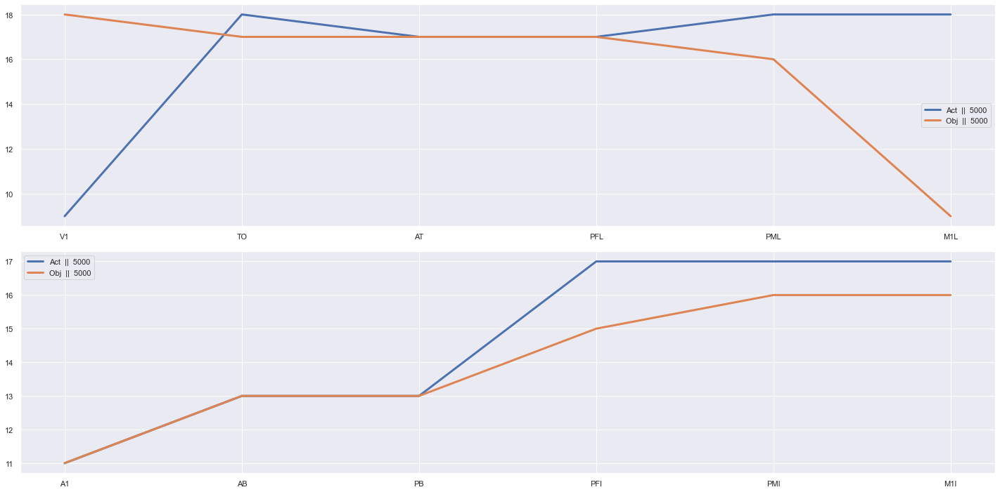

In [1128]:
max_act = get_max_index(dfS_mean, 'Act')
max_obj = get_max_index(dfS_mean, 'Obj')


plt.subplot(211)
plt.plot(max_act.iloc[:6,:][presentation], linewidth = 3,label = 'Act  ||  '+str(presentation))
plt.plot(max_obj.iloc[:6,:][presentation], linewidth = 3,label = 'Obj  ||  '+str(presentation))
plt.legend()
plt.subplot(212)
plt.plot(max_act.iloc[6:,:][presentation], linewidth = 3,label = 'Act  ||  '+str(presentation))
plt.plot(max_obj.iloc[6:,:][presentation], linewidth = 3,label = 'Obj  ||  '+str(presentation))
plt.legend()

In [1090]:
max_act.index[j]

'M1I'

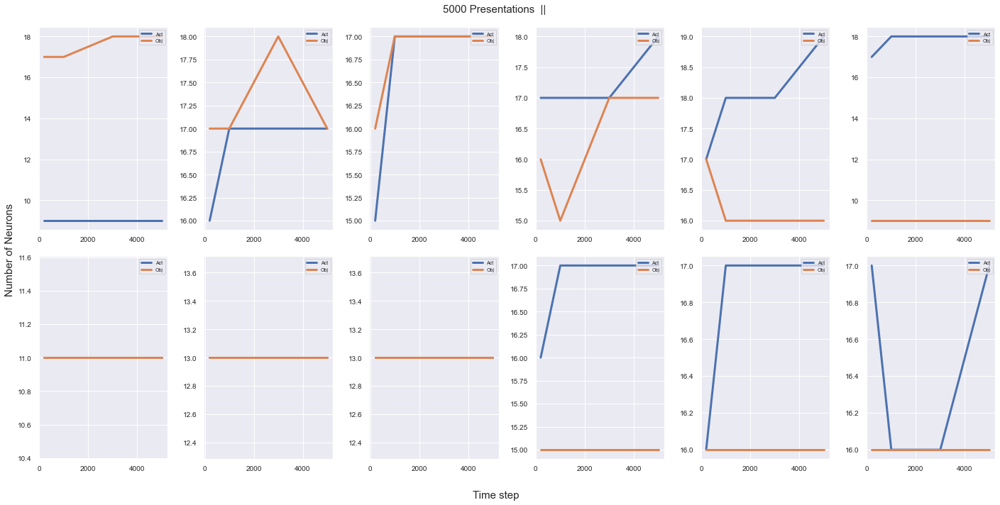

In [1094]:
fig, axs= plt.subplots(6, 2)
font_size_number = 10
for j in range(0, 12):
        area = max_act.index[j]
        plt.subplot(2,6, (j+1))
        plt.plot(max_act[max_act.index==area].T, linewidth = 3,label = 'Act')
        plt.plot(max_obj[max_obj.index==area].T, linewidth = 3,label = 'Obj')
                 
        #plt.ylim([0, max_])
        plt.xticks(fontsize=font_size_number)
        plt.yticks(fontsize=font_size_number)

        plt.suptitle(str(presentation)+' Presentations  || ', fontsize=font_size_number+5)
        plt.legend(loc='upper right', fontsize=font_size_number-3)
        fig.supylabel("Number of Neurons",fontsize=font_size_number+5)
        fig.supxlabel("Time step",fontsize=font_size_number+5)

In [1103]:
max_act.iloc[6:,:]

,200,1000,3000,5000
A1,11,11,11,11
AB,13,13,13,13
PB,13,13,13,13
PFI,16,17,17,17
PMI,16,17,17,17
M1I,17,16,16,17


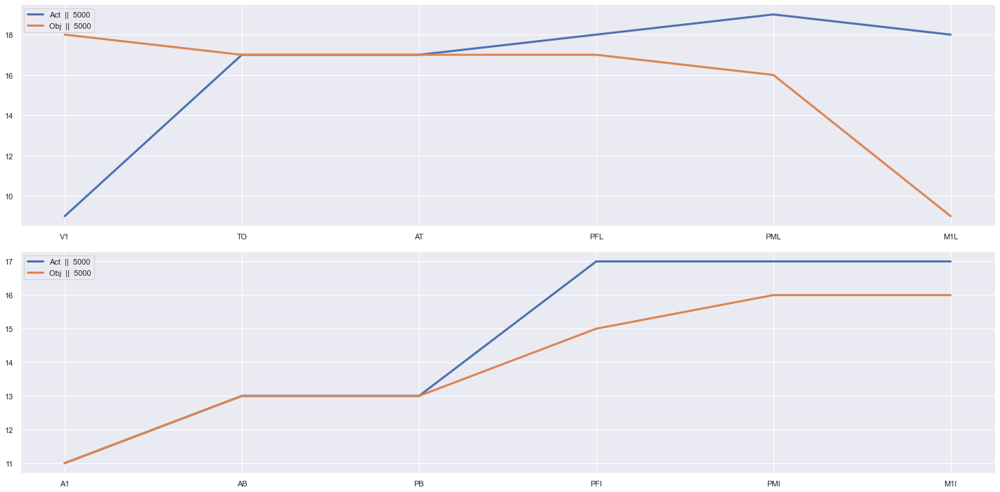

In [1110]:
plt.subplot(211)
plt.plot(max_act.iloc[:6,:][presentation], linewidth = 3,label = 'Act  ||  '+str(presentation))
plt.plot(max_obj.iloc[:6,:][presentation], linewidth = 3,label = 'Obj  ||  '+str(presentation))
plt.legend()
plt.subplot(212)
plt.plot(max_act.iloc[6:,:][presentation], linewidth = 3,label = 'Act  ||  '+str(presentation))
plt.plot(max_obj.iloc[6:,:][presentation], linewidth = 3,label = 'Obj  ||  '+str(presentation))
plt.legend()

In [1065]:
max_stpS = []
presentationS = []
for presentation in [200, 1000, 3000, 5000]:
    presentationS.append(presentation)
    dfS_max = dfS_mean.xs('Act',0,'Specificity').xs(presentation,0,'Presentation').max()
    dfS_max[dfS_max<1]=0
    df_mean_spe = dfS_mean.xs('Act',0,'Specificity').xs(presentation,0,'Presentation')
    max_stp = []
    for area in dfS_max.index:
        max_stp.append(df_mean_spe[df_mean_spe==dfS_max][area].dropna().index[0])
    max_stp = pd.DataFrame(max_stp, index=dfS_max.index, columns=[presentation])
    max_stpS.append(max_stp)


<AxesSubplot:>

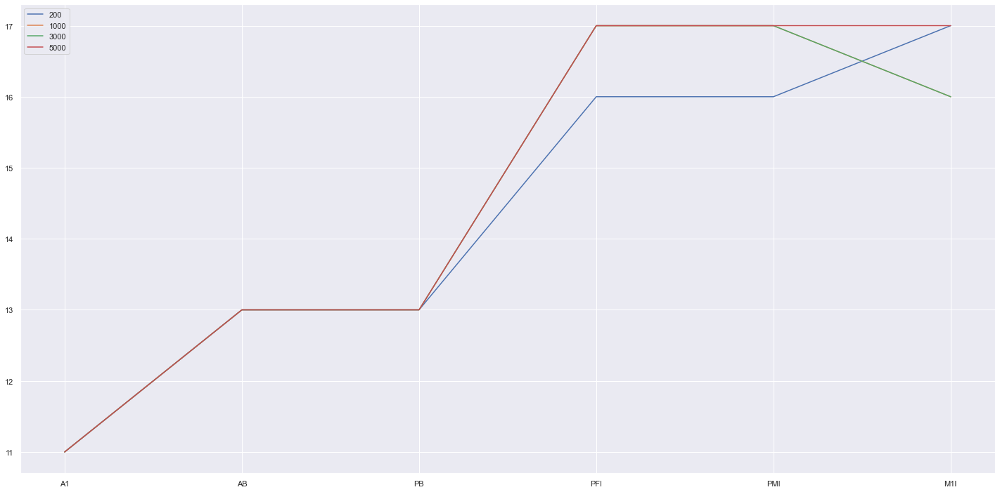

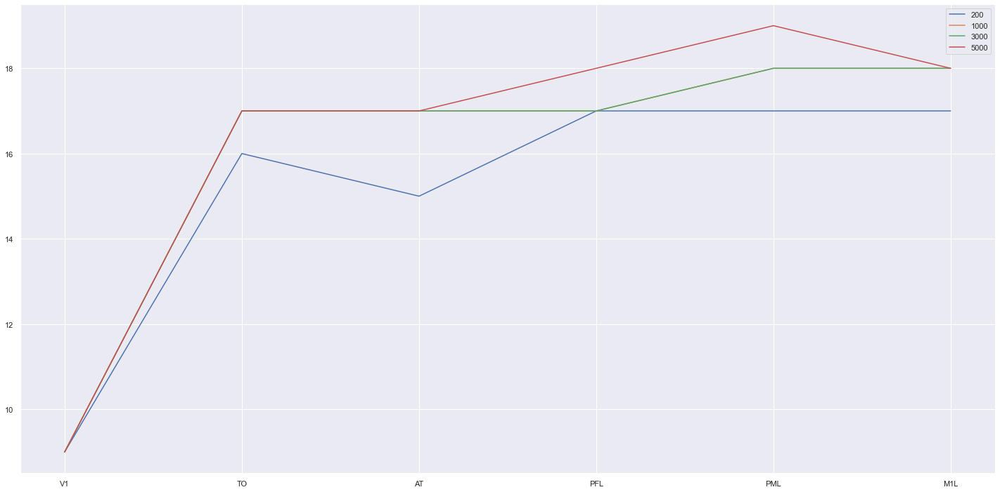

In [1066]:
pd.concat(max_stpS,1).T.iloc[:,6:].T.plot()
pd.concat(max_stpS,1).T.iloc[:,:6].T.plot()

In [1008]:
max_stp = []
for area in dfS_max.index:
    max_stp.append(df_mean_spe[df_mean_spe==dfS_max][area].dropna().index[0])
    

In [1014]:
pd.DataFrame(max_stp, index=dfS_max.index)

,0
V1,12
TO,17
AT,17
PFL,18
PML,19
M1L,18
A1,11
AB,13
PB,13
PFI,17


In [1046]:
dfS.groupby(['stp','Presentation','Specificity']).max().drop(columns=['stim','patt_no'])

V1   TO   AT  PFL  PML  M1L   A1    AB    PB  \
stp Presentation Specificity                                                  
9   10           Act          0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0   0.0   
                 Obj          0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0   0.0   
    20           Act          0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0   0.0   
                 Obj          0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0   0.0   
    50           Act          0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0   0.0   
...                           ...  ...  ...  ...  ...  ...  ...   ...   ...   
29  3000         Obj          0.0  1.0  5.0  5.0  1.0  0.0  4.0  12.0  11.0   
    4000         Act          0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0   0.0   
                 Obj          0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0   0.0   
    5000         Act          0.0  0.0  0.0  1.0  0.0  0.0  0.0   0.0   0.0   
                 Obj          0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0   0.0   

                              PFI  PMI  M1I  
stp Presentation Specificity                 
9   10           Act          0.0  0.0  0.0  
                 Obj          0.0  0.0  0.0  
    20           Act          0.0  0.0  0.0  
                 Obj          0.0  0.0  0.0  
    50           Act          0.0  0.0  0.0  
...                           ...  ...  ...  
29  3000         Obj          7.0  1.0  0.0  
    4000         Act          0.0  0.0  0.0  
                 Obj          0.0  0.0  0.0  
    5000         Act          0.0  0.0  0.0  
                 Obj          0.0  0.0  0.0  

[462 rows x 12 columns]

In [850]:
tata = dfS.xs('Act',0,'Specificity')
for i in tata.reset_index().Presentation.unique():
    plt.plot(tata.xs(i,0,'Presentation').sum(1), label=str(i))
    plt.legend()

AttributeError: 'list' object has no attribute 'xs'

<AxesSubplot:xlabel='stp'>

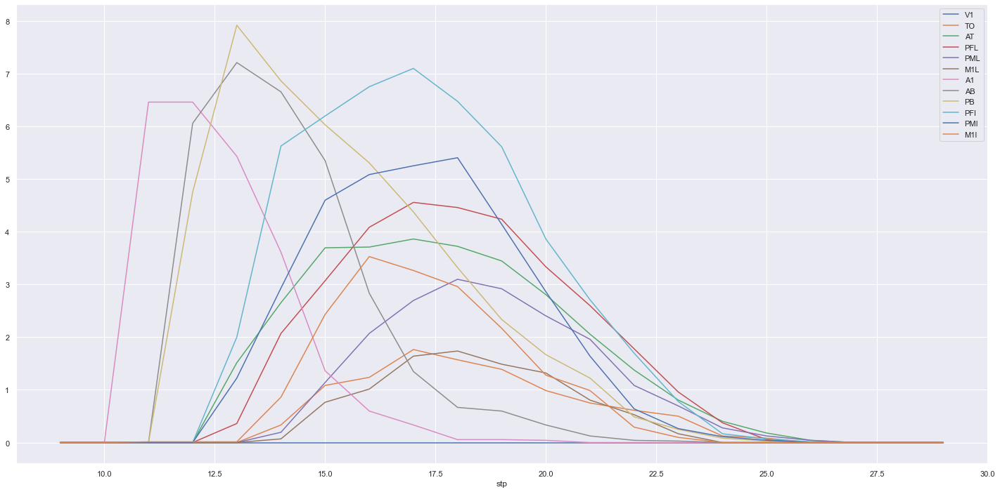

In [498]:
df = dfS[dfS.patt_no==(dfS.Pattern+1)]
df = df.groupby(['Specificity', 'Presentation', 'stp']).mean()
df= df.drop(columns=['stim','patt_no','Pattern'])
df.xs(100,0,'Presentation').xs('Act',0,'Specificity').plot()

### Add presentation Total Area

In [848]:
directoryS_timecourse = [time_course7_Area]
directoryS_order_file = [order_file7]

dfS = []
for network in range(0, len(directoryS_timecourse)):
    df_TCA = pd.read_csv(directoryS_timecourse[network], sep = " |\t")
    df_TCA = df_TCA[(df_TCA.patt_no!=0)&(df_TCA.patt_no!=13)]
    order_file = get_correct_order_files_reading2(directoryS_order_file[network])

df_TCA

print(len(order_file))
print(len(df_TCA.Network.unique()))

10
10


In [737]:
order_file
df_order = pd.read_csv('/Users/mc/Downloads/results_R2/All_dat_file.txt')
df_order = [int(k.replace('net','').replace('_adj.dat','').replace(' ','')) for k in df_order['File to read:']]
df_order

[2000, 50, 5000, 10, 200, 1000, 100, 3000, 500, 20]

In [841]:

def get_correct_order_files_reading2(dir_file_order):
    df = pd.read_csv(dir_file_order)
    df = [int(k.replace('net','').replace('_adj.dat','').replace(' ','')) for k in df['File to read:']]
    return df

In [729]:
order_file

[50, 5000, 10, 200, 1000, 100, 3000, 500, 20]

In [728]:
df_TCA

,Network,stim,stp,patt_no,V1,TO,AT,PFL,PML,M1L,A1,AB,PB,PFI,PMI,M1I
1,0,1,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0,1,2,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0,1,3,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0,1,4,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0,1,5,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15152,9,3,38,12,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
15153,9,3,39,12,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
15154,9,3,40,12,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
15155,9,3,41,12,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [723]:
df = df_TCA
df_pres = []
number_presentation = len(df.Network.unique()) 
for i in range(0, number_presentation):
    #dfaa_pres.append(add_presentation(df.iloc[i*nb_time_step:nb_time_step*(i+1)], order_file[i]))
    df_pres.append(add_presentation(df[df.Network==i], order_file[i]))
df_pres = pd.concat(df_pres).reset_index().drop(columns=['level_1', 'Network'])

df_pres = df_pres.groupby(['Presentation','stp']).mean()
df_pres

IndexError: list index out of range

In [752]:
def add_presentation_total_Area_2(df, order_file):
    "Add presentation based on order of file for the total df"
    df_pres = []
    number_presentation = len(df.Network.unique()) - 1
    for i in range(0, number_presentation):
        #dfaa_pres.append(add_presentation(df.iloc[i*nb_time_step:nb_time_step*(i+1)], order_file[i]))
        df_pres.append(add_presentation(df[df.Network==i], order_file[i]))

    df_pres = pd.concat(df_pres).reset_index().drop(columns=['level_1', 'Network'])
    df_pres = df_pres.set_index('Presentation')
    return df_pres

In [691]:
df

,Network,stim,stp,patt_no,V1,TO,AT,PFL,PML,M1L,A1,AB,PB,PFI,PMI,M1I
1,0,1,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0,1,2,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0,1,3,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0,1,4,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0,1,5,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15152,9,3,38,12,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
15153,9,3,39,12,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
15154,9,3,40,12,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
15155,9,3,41,12,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [711]:
print(len(order_file))
print(len(df.Network.unique()))

9
10


In [709]:
order_file

[50, 5000, 10, 200, 1000, 100, 3000, 500, 20]

In [704]:
df[df.Network==]

,Network,stim,stp,patt_no,V1,TO,AT,PFL,PML,M1L,A1,AB,PB,PFI,PMI,M1I


In [710]:
print(len(df.Network.unique()))

10

In [688]:
df = df_TCA

df_pres = []
number_presentation = len(df.Network.unique())
for i in range(0, number_presentation):
    #df_pres.append(add_presentation(df.iloc[i*nb_time_step:nb_time_step*(i+1)], order_file[i]))
    df_pres.append(add_presentation(df[df.Network==i], order_file[i]))

df_pres = pd.concat(df_pres).reset_index().drop(columns=['level_1', 'Network'])
df_pres = df_pres.set_index('Presentation')
df_pres

IndexError: list index out of range

In [634]:
df_pres#.xs(5000,0,'Presentation').xs('Act',0,'Specificity')

,stim,stp,patt_no,V1,TO,AT,PFL,PML,M1L,A1,AB,PB,PFI,PMI,M1I
Presentation,,,,,,,,,,,,,,,
50,1,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50,1,2,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50,1,3,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50,1,4,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50,1,5,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
500,3,38,12,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
500,3,39,12,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
500,3,40,12,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### READ TCA  AREA

In [899]:
def test_read(directoryS_timecourse_Area, directoryS_order_file):
    dfS = []
    for network in range(0, len(directoryS_timecourse_Area)):
        df_TCA = pd.read_csv(directoryS_timecourse_Area[network], sep = " |\t")
        df_TCA = df_TCA[(df_TCA.patt_no!=0)&(df_TCA.patt_no!=13)]
        order_file = get_correct_order_files_reading2(directoryS_order_file[network])
        df = add_presentation_total_Area_2(df_TCA, order_file)
        df = add_NN_Number(df, network)
        dfS.append(df)

    dfS = pd.concat(dfS)
    dfS = shorten_stp(dfS, 8, 30)
    dfS = remove_0_and_13(dfS)
    dfS = add_specificity_patt_no(dfS)
    return dfS

test_read(directoryS_timecourse_Area, directoryS_order_file)

stim  stp  patt_no   V1   TO    AT   PFL  \
Specificity Network Presentation                                             
Obj         0       2000             1    9        1  0.0  0.0   0.0   0.0   
                    2000             1   10        1  0.0  0.0   0.0   0.0   
                    2000             1   11        1  0.0  0.0   0.0   0.0   
                    2000             1   12        1  1.0  0.0   0.0   0.0   
                    2000             1   13        1  1.0  0.0  25.0  14.0   
...                                ...  ...      ...  ...  ...   ...   ...   
Act         6       20               3   29       12  0.0  0.0   0.0   0.0   
                    20               3   29       12  0.0  0.0   0.0   0.0   
                    20               3   29       12  0.0  0.0   0.0   0.0   
                    20               3   29       12  0.0  0.0   0.0   0.0   
                    20               3   29       12  0.0  0.0   0.0   0.0   

                                  PML  M1L    A1    AB    PB   PFI   PMI  M1I  \
Specificity Network Presentation                                                
Obj         0       2000          0.0  0.0   0.0   0.0   0.0   0.0   0.0  0.0   
                    2000          0.0  0.0   0.0   0.0   0.0   0.0   0.0  0.0   
                    2000          0.0  0.0  19.0   0.0   0.0   0.0   0.0  0.0   
                    2000          0.0  0.0  19.0  33.0  28.0   0.0   0.0  0.0   
                    2000          0.0  0.0  20.0  22.0  22.0  30.0  29.0  0.0   
...                               ...  ...   ...   ...   ...   ...   ...  ...   
Act         6       20            0.0  0.0   0.0   0.0   0.0   0.0   0.0  0.0   
                    20            0.0  0.0   0.0   0.0   0.0   0.0   0.0  0.0   
                    20            0.0  0.0   0.0   0.0   0.0   0.0   0.0  0.0   
                    20            0.0  0.0   0.0   0.0   0.0   0.0   0.0  0.0   
                    20            0.0  0.0   0.0   0.0   0.0   0.0   0.0  0.0   

                                  Pattern  
Specificity Network Presentation           
Obj         0       2000              NaN  
                    2000              NaN  
                    2000              NaN  
                    2000              NaN  
                    2000              NaN  
...                                   ...  
Act         6       20                7.0  
                    20                8.0  
                    20                9.0  
                    20               10.0  
                    20               11.0  

[467964 rows x 16 columns]

In [900]:
directoryS_timecourse = [time_course2_Area, time_course2_Area, time_course3_Area, 
                         time_course4_Area, time_course5_Area, time_course6_Area,
                        time_course7_Area]
directoryS_order_file = [order_file2, order_file2, order_file3, order_file4,
                         order_file5, order_file6, order_file7]

dfS = []
for network in range(0, len(directoryS_timecourse)):
    df_TCA = pd.read_csv(directoryS_timecourse[network], sep = " |\t")
    df_TCA = df_TCA[(df_TCA.patt_no!=0)&(df_TCA.patt_no!=13)]
    order_file = get_correct_order_files_reading2(directoryS_order_file[network])
    df = add_presentation_total_Area_2(df_TCA, order_file)
    df = add_NN_Number(df, network)
    dfS.append(df)

dfS = pd.concat(dfS)
dfS = shorten_stp(dfS, 8, 30)
dfS = remove_0_and_13(dfS)
dfS = add_specificity_patt_no(dfS)


<AxesSubplot:xlabel='stp'>

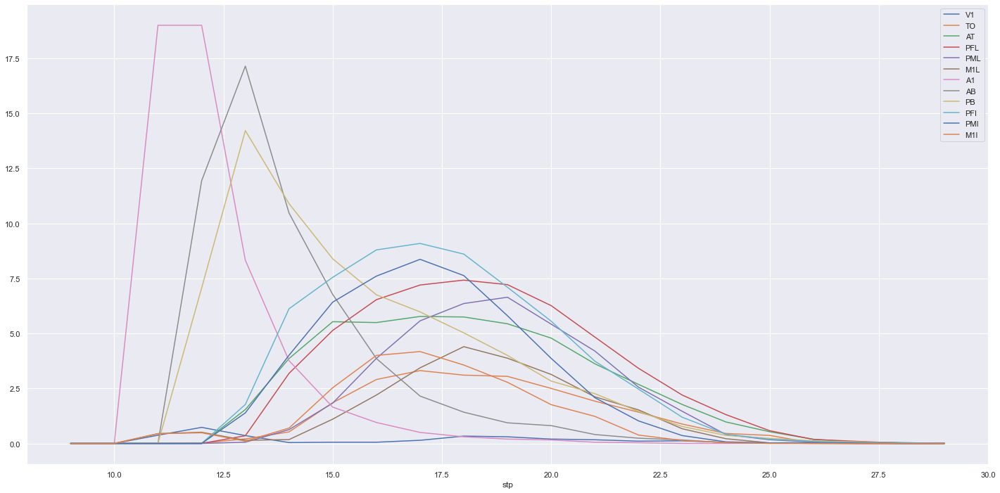

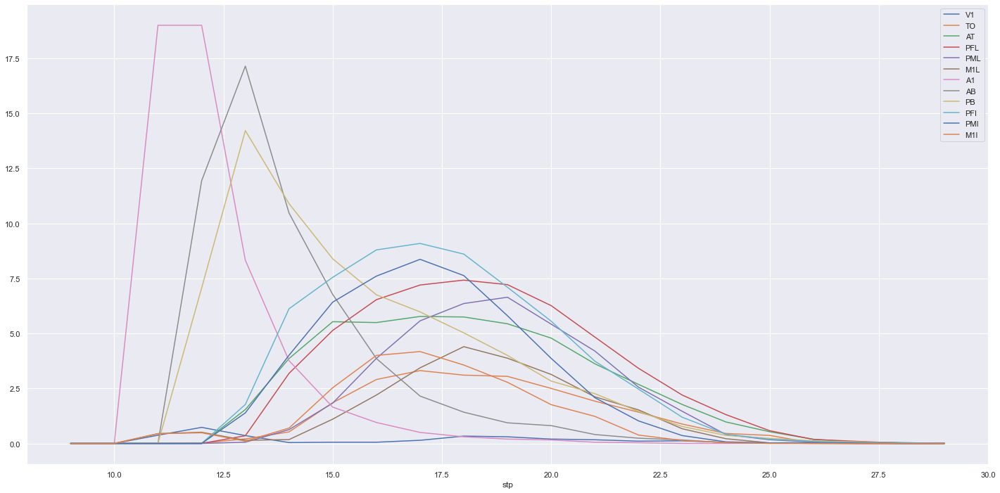

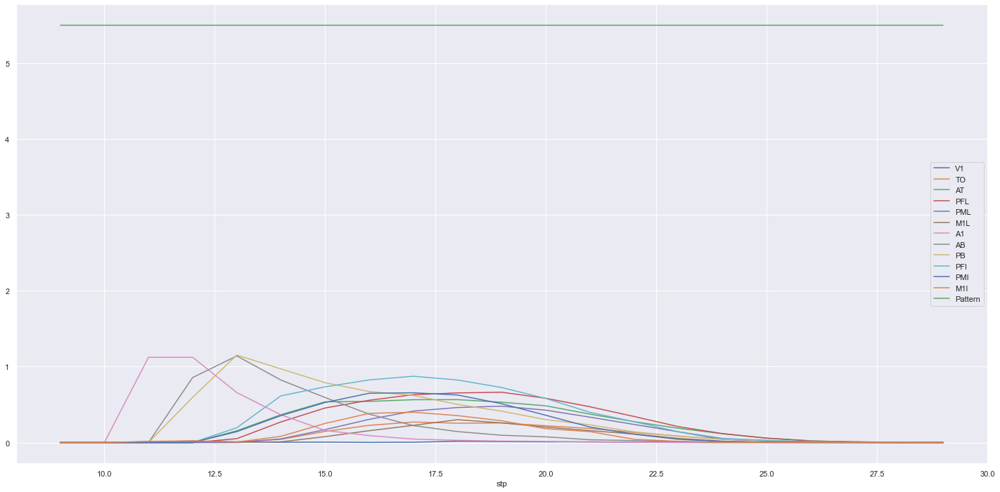

In [901]:
presentation = 5000
test_1 = dfS.xs('Act',0,'Specificity').xs(presentation,0,'Presentation').groupby(['stp']).mean()
test_1.drop(columns=['stim','patt_no']).plot()


test_2= dfS.groupby(['stp','Specificity','Presentation']).mean().xs('Act',0,'Specificity').xs(presentation,0,'Presentation')
test_1.drop(columns=['stim','patt_no']).plot()

test_3 = test_read(directoryS_timecourse_Area, directoryS_order_file)
test_3= test_3.groupby(['stp','Specificity','Presentation']).mean().xs('Act',0,'Specificity').xs(presentation,0,'Presentation')
test_3.drop(columns=['stim','patt_no']).plot()

<AxesSubplot:xlabel='stp'>

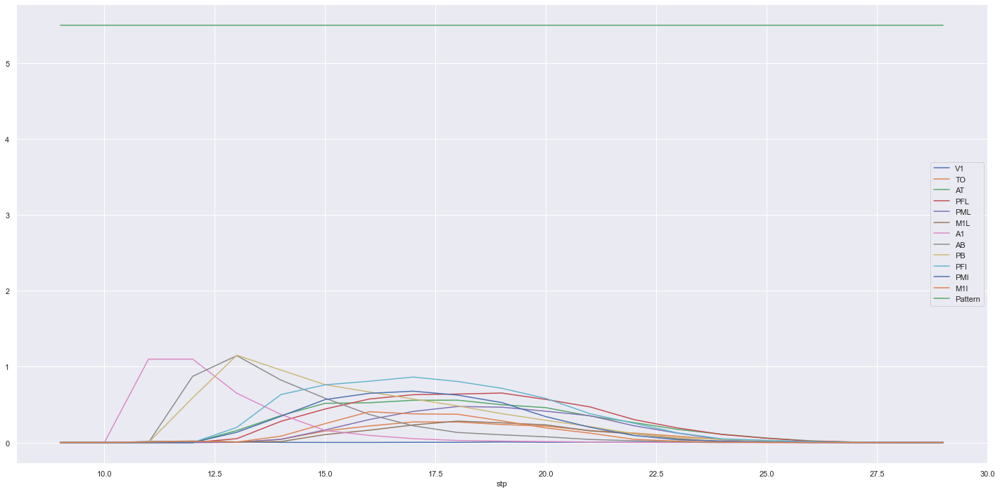

In [862]:
dfS = read_TCA_order_Area2(directoryS_timecourse_Area, directoryS_order_file)
dfS = dfS.xs('Act',0,'Specificity').xs(3000,0,'Presentation').groupby(['stp']).mean()
dfS.drop(columns=['stim','patt_no']).plot()

### Order File ==> WORKING

In [645]:

df = pd.read_csv(order_file3, header=None)
df = [int(k.replace('net','').replace('_adj.dat','').replace(' ','')) for k in df[0]]
order = [k for k in range(0,len(df))]
order.sort(reverse=True)
df = [df[i] for i in order]
df

[50, 5000, 10, 200, 1000, 100, 3000, 500, 20]

###  Test Plot

In [637]:
dfS

stim  stp  patt_no   V1   TO    AT   PFL  \
Specificity Network Presentation                                             
Obj         0       50               1    9        1  0.0  0.0   0.0   0.0   
                    50               1   10        1  0.0  0.0   0.0   0.0   
                    50               1   11        1  0.0  0.0   0.0   0.0   
                    50               1   12        1  1.0  0.0   0.0   0.0   
                    50               1   13        1  1.0  0.0  25.0  14.0   
...                                ...  ...      ...  ...  ...   ...   ...   
Act         0       3000             3   25       12  0.0  0.0   0.0   0.0   
                    3000             3   26       12  0.0  0.0   0.0   0.0   
                    3000             3   27       12  0.0  0.0   0.0   0.0   
                    3000             3   28       12  0.0  0.0   0.0   0.0   
                    3000             3   29       12  0.0  0.0   0.0   0.0   

                                  PML  M1L    A1    AB    PB   PFI   PMI  M1I  
Specificity Network Presentation                                               
Obj         0       50            0.0  0.0   0.0   0.0   0.0   0.0   0.0  0.0  
                    50            0.0  0.0   0.0   0.0   0.0   0.0   0.0  0.0  
                    50            0.0  0.0  19.0   0.0   0.0   0.0   0.0  0.0  
                    50            0.0  0.0  19.0  33.0  28.0   0.0   0.0  0.0  
                    50            0.0  0.0  20.0  22.0  22.0  30.0  29.0  0.0  
...                               ...  ...   ...   ...   ...   ...   ...  ...  
Act         0       3000          0.0  0.0   0.0   0.0   0.0   0.0   0.0  0.0  
                    3000          0.0  0.0   0.0   0.0   0.0   0.0   0.0  0.0  
                    3000          0.0  0.0   0.0   0.0   0.0   0.0   0.0  0.0  
                    3000          0.0  0.0   0.0   0.0   0.0   0.0   0.0  0.0  
                    3000          0.0  0.0   0.0   0.0   0.0   0.0   0.0  0.0  

[5292 rows x 15 columns]

In [783]:
tata = dfS.groupby(['Presentation','stp', 'Specificity']).mean().drop(columns=['stim', 'patt_no'])
tata = tata.xs('Act',0,'Specificity')
for i in tata.reset_index().Presentation.unique():
    plt.plot(tata.xs(i,0,'Presentation').sum(1), label=str(i))
    plt.legend()

KeyError: "['stim' 'patt_no'] not found in axis"

In [598]:
dfS.xs(5000,0,'Presentation')

stim  stp  patt_no   V1   TO   AT  PFL  PML  M1L    A1  \
Specificity Network                                                           
Obj         0           1    9        1  0.0  0.0  0.0  0.0  0.0  0.0   0.0   
            0           1   10        1  0.0  0.0  0.0  0.0  0.0  0.0   0.0   
            0           1   11        1  0.0  0.0  0.0  0.0  0.0  0.0   0.0   
            0           1   12        1  0.0  0.0  0.0  0.0  0.0  0.0   0.0   
            0           1   13        1  0.0  0.0  0.0  0.0  0.0  0.0  19.0   
...                   ...  ...      ...  ...  ...  ...  ...  ...  ...   ...   
Act         0           3   25       12  0.0  0.0  0.0  0.0  0.0  0.0   0.0   
            0           3   26       12  0.0  0.0  0.0  0.0  0.0  0.0   0.0   
            0           3   27       12  0.0  0.0  0.0  0.0  0.0  0.0   0.0   
            0           3   28       12  0.0  0.0  0.0  0.0  0.0  0.0   0.0   
            0           3   29       12  0.0  0.0  0.0  0.0  0.0  0.0   0.0   

                      AB   PB  PFI  PMI  M1I  
Specificity Network                           
Obj         0        0.0  0.0  0.0  0.0  0.0  
            0        0.0  0.0  0.0  0.0  0.0  
            0        0.0  0.0  0.0  0.0  0.0  
            0        0.0  0.0  0.0  0.0  0.0  
            0        0.0  0.0  0.0  0.0  2.0  
...                  ...  ...  ...  ...  ...  
Act         0        0.0  0.0  0.0  0.0  0.0  
            0        0.0  0.0  0.0  0.0  0.0  
            0        0.0  0.0  0.0  0.0  0.0  
            0        0.0  0.0  0.0  0.0  0.0  
            0        0.0  0.0  0.0  0.0  0.0  

[756 rows x 15 columns]

In [463]:
get_correct_order_files_reading(directoryS_order_file[network])

[50, 5000, 10, 200, 1000, 100, 3000, 20]

In [464]:
order_file

[50, 5000, 10, 200, 1000, 100, 3000, 20]

In [378]:
directoryS_timecourse

['/Users/mc/Downloads/results_R1/Recording_current_value_rate_all.txt',
 '/Users/mc/Downloads/results_R2/Recording_current_value_rate_all.txt']

<AxesSubplot:xlabel='stp'>

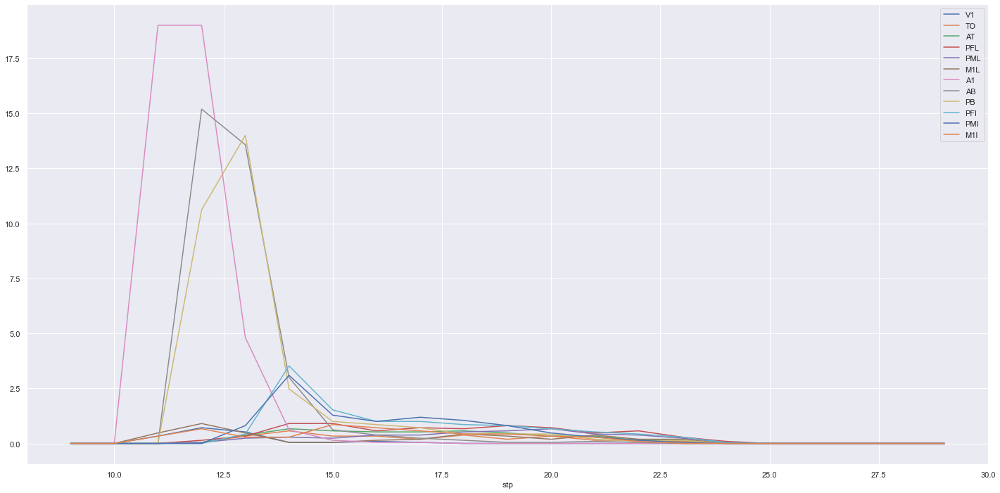

In [376]:
dfS_Area_order = read_TCA_order_Area(directoryS_timecourse_Area, directoryS_order_file)
dfS_Area_order = dfS_Area_order.xs(5000,0,'Presentation').xs('Act',0,'Specificity')
dfS_Area_order = dfS_Area_order.reset_index().set_index(['Network','stp']).drop(columns=['patt_no'])
dfS_Area_order.reset_index()[dfS_Area_order.reset_index().Network==0].groupby(('stp')).mean().iloc[:,2:].plot()

In [347]:
dfS_Area_order.xs(5000,0,'Presentation').xs('Act',0,'Specificity').set

,stim,stp,patt_no,V1,TO,AT,PFL,PML,M1L,A1,AB,PB,PFI,PMI,M1I
Network,,,,,,,,,,,,,,,
0,1,9,7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0,1,10,7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0,1,11,7,0.0,0.0,0.0,0.0,0.0,1.0,19.0,0.0,0.0,0.0,0.0,2.0
0,1,12,7,1.0,0.0,0.0,3.0,1.0,1.0,19.0,20.0,16.0,0.0,0.0,2.0
0,1,13,7,1.0,0.0,0.0,0.0,0.0,1.0,5.0,12.0,11.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1,1,25,12,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,26,12,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,27,12,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<AxesSubplot:xlabel='stp'>

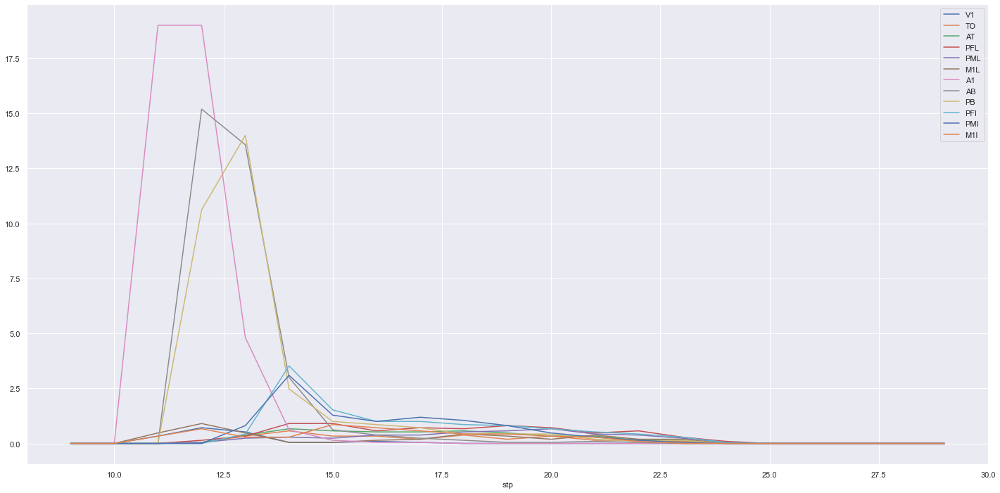

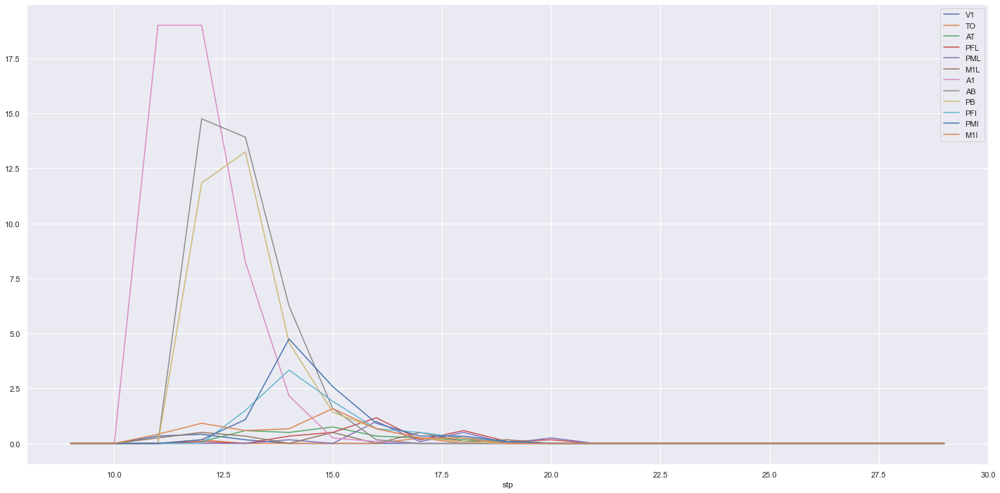

In [327]:
tata = dfS_Area_order.xs(5000,0,'Presentation').xs('Act',0,'Specificity').groupby(['stp', 'Network']).mean()
tata.xs(0,0,'Network').iloc[:,2:].plot()
tata.xs(1,0,'Network').iloc[:,2:].plot()

In [643]:
dfS_Area_order = read_TCA_order_Area(directoryS_timecourse_Area, directoryS_order_file)
df_mean_area, df_std_area = groupby_area(dfS_Area_order)
df_mean_area.xs(5000,0,'Presentation').xs('Act',0,'Specificity').plot()

IndexError: list index out of range

In [316]:
tata = dfS.xs(3000,0,'Presentation').xs('Act',0,'Specificity')#.xs(0,0,'Network')
tata[tata.index==0]#.groupby(['stp', 'patt_no']).mean().iloc[:,2:].plot()

,stim,stp,patt_no,Pattern,V1,TO,AT,PFL,PML,M1L,A1,AB,PB,PFI,PMI,M1I
Network,,,,,,,,,,,,,,,,
0,1,9,7,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0,1,10,7,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0,1,11,7,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0,1,12,7,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0,1,13,7,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,3,25,12,11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0,3,26,12,11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0,3,27,12,11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [477]:
df_mean = TCA_ca_patt(dfS)

AttributeError: 'list' object has no attribute 'patt_no'

<AxesSubplot:xlabel='stp'>

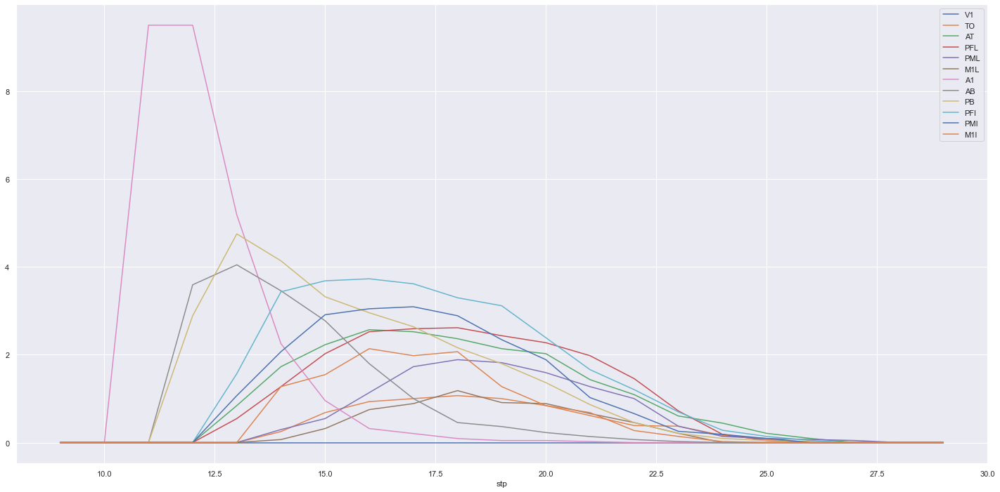

In [300]:
df_mean.xs(3000,0,'Presentation').xs('Act',0,'Specificity').plot()

In [482]:
df_mean = TCA_ca_patt(dfS)
df_mean.xs(3000,0,'Presentation').xs("Act",0,'Specificity')

,V1,TO,AT,PFL,PML,M1L,A1,AB,PB,PFI,PMI,M1I
stp,,,,,,,,,,,,
9,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
10,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
11,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,8.250000,0.000000,0.000000,0.000000,0.000000,0.000000
12,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,8.250000,4.777778,5.097222,0.000000,0.000000,0.000000
13,0.0,0.000000,0.583333,0.041667,0.000000,0.000000,6.180556,4.888889,5.236111,1.444444,0.986111,0.000000
14,0.0,0.027778,0.680556,0.208333,0.027778,0.000000,2.513889,4.000000,4.430556,2.555556,1.875000,0.527778
15,0.0,0.055556,0.638889,0.069444,0.055556,0.083333,0.583333,2.250000,2.527778,1.958333,2.305556,1.347222
16,0.0,0.000000,0.569444,0.194444,0.097222,0.013889,0.250000,0.611111,0.902778,1.763889,2.083333,1.402778
17,0.0,0.041667,0.402778,0.055556,0.027778,0.041667,0.000000,0.194444,0.361111,1.194444,1.263889,0.819444


In [864]:
def plot_activity_against_ca_activity(df_mean_area, df_mean, presentation, specificity):
    df_mean_area = df_mean_area.xs(presentation,0,'Presentation').xs(specificity,0,'Specificity')
    df_mean = df_mean.xs(presentation,0,'Presentation').xs(specificity,0,'Specificity')
    max_ = df_mean_area.max().max()+1
    for j in range(0, 12):
        areaS = df_mean_area.columns[j]
        plt.subplot(2,6, (j+1))
        plt.plot(df_mean_area[areaS], label = 'Total Activity')
        plt.plot(df_mean[areaS], label = 'From CA Act')
        plt.ylim([0,max_])
        plt.legend()
        

df_mean = TCA_ca_patt(dfS)
#dfS_Area_order = read_TCA_order_Area(directoryS_timecourse_Area, directoryS_order_file)
df_mean_area, df_std_area = groupby_area(dfS_Area_order)
plot_activity_against_ca_activity(df_mean_area, df_mean, 5000, 'Obj')

KeyError: 'Specificity'

In [192]:
def TCA_ca_patt(dfS):
    "From DFS to the specific activation mean of CA patt presented"
    df = dfS[dfS.patt_no==(dfS.Pattern+1)]
    df = df.groupby(['Specificity', 'Presentation', 'stp']).mean()
    df= df.drop(columns=['stim','patt_no','Pattern'])
    return df

<AxesSubplot:xlabel='stp'>

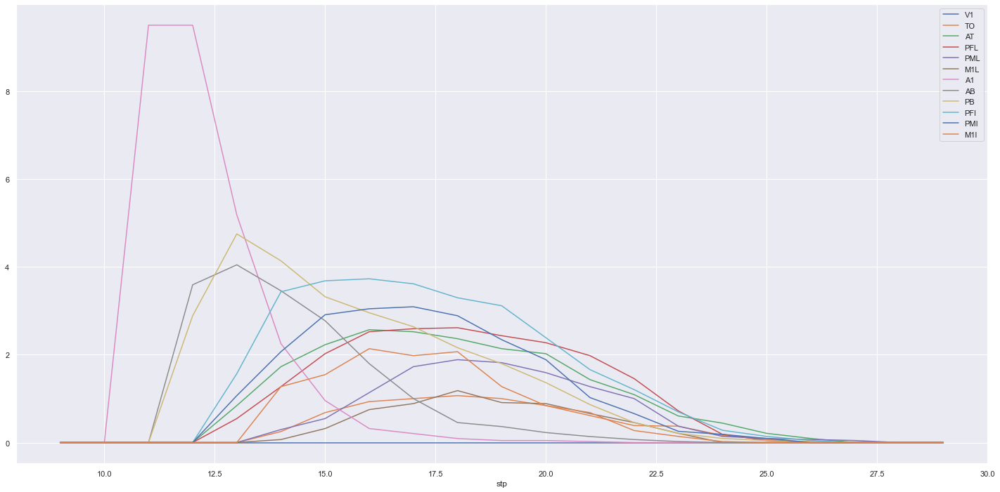

In [193]:
TCA_ca_patt(dfS).xs(3000,0,'Presentation').xs('Act',0,'Specificity').plot()

In [ ]:
#tata = dfS[dfS.patt_no==(dfS.Pattern+1)].xs(3000,0,'Presentation')#.groupby(['Specificity', 'Presentation', 'stp']).mean()
#tata = tata[tata.stim==1]
tata[tata.patt_no==1].iloc[:,4:].plot()

In [ ]:

dfS_grp = dfS[dfS.patt_no==dfS.Pattern].groupby(['Specificity', 'Presentation', 'stp', 'stim']).mean()
dfS_grp#.xs('Act',0,'Specificity').xs(100,0,'Presentation')#.iloc[:,3:].plot()

In [336]:
df_mean

V1        TO        AT       PFL  \
Specificity Presentation stp                                           
Act         10           9    0.000000  0.000000  0.000000  0.000000   
                         10   0.000000  0.000000  0.000000  0.000000   
                         11   0.000000  0.000000  0.000000  0.000000   
                         12   0.000000  0.000000  0.000000  0.000000   
                         13   0.000000  0.000000  0.466667  0.177778   
...                                ...       ...       ...       ...   
Obj         5000         25   0.022727  0.022727  0.136364  0.227273   
                         26   0.000000  0.000000  0.045455  0.136364   
                         27   0.000000  0.000000  0.000000  0.045455   
                         28   0.000000  0.000000  0.000000  0.000000   
                         29   0.000000  0.000000  0.000000  0.000000   

                                   PML  M1L        A1        AB        PB  \
Specificity Presentation stp                                                
Act         10           9    0.000000  0.0  0.000000  0.000000  0.000000   
                         10   0.000000  0.0  0.000000  0.000000  0.000000   
                         11   0.000000  0.0  8.644444  0.000000  0.000000   
                         12   0.000000  0.0  8.644444  4.133333  3.222222   
                         13   0.000000  0.0  5.133333  4.422222  4.311111   
...                                ...  ...       ...       ...       ...   
Obj         5000         25   0.045455  0.0  0.000000  0.000000  0.045455   
                         26   0.022727  0.0  0.000000  0.000000  0.022727   
                         27   0.000000  0.0  0.000000  0.000000  0.000000   
                         28   0.000000  0.0  0.000000  0.000000  0.000000   
                         29   0.000000  0.0  0.000000  0.000000  0.000000   

                                   PFI       PMI       M1I  
Specificity Presentation stp                                
Act         10           9    0.000000  0.000000  0.000000  
                         10   0.000000  0.000000  0.000000  
                         11   0.000000  0.000000  0.022222  
                         12   0.000000  0.000000  0.044444  
                         13   1.177778  0.533333  0.022222  
...                                ...       ...       ...  
Obj         5000         25   0.159091  0.022727  0.000000  
                         26   0.022727  0.000000  0.000000  
                         27   0.000000  0.000000  0.000000  
                         28   0.000000  0.000000  0.000000  
                         29   0.000000  0.000000  0.000000  

[420 rows x 12 columns]

In [ ]:
dfS = read_TCA_order(directoryS_timecourse, directoryS_order_file)
dfS_grp, dfS_std = groupby_TCA(dfS)
plot_TCA_presentation_std(dfS_grp,dfS_std, 5000, 6)

In [ ]:
df.reset_index()['Pattern'].equals(df.reset_index()['patt_no'])

In [ ]:
filtre = np.where(df.reset_index()['Pattern'] == df.reset_index()['patt_no'], True, False)
filtre

In [ ]:
df[filtre]

In [ ]:
tata = dfS.xs(5000,0,'Presentation').xs('Obj',0,'Specificity').groupby(['stim','stp','patt_no']).sum()
tata.groupby(['stp']).mean()['A1']

In [ ]:
def groupby_TCA_2(df):
    "groupby the dfS to get only as index: Specificity, Presentation and stp"
    df = df.groupby(['Presentation','Specificity','stp', 'Network','patt_no']).sum()
    df_std = df.groupby(['Presentation', 'Specificity','stp']).std().drop(columns=['stim','Pattern'])
    df = df.groupby(['Presentation', 'Specificity','stp']).mean().drop(columns=['stim','Pattern'])
    return df, df_std

In [ ]:
dfS.grouby()

In [ ]:
tutu[tutu.Pattern==3].groupby('stp').sum().iloc[:,3:]#.plot()

In [ ]:
tutu[tutu.patt_no==3][tutu[tutu.patt_no==3]['Pattern']==2].groupby('stp').sum().iloc[:,3:10].plot()

In [ ]:
stim = 2
tata = dfS.xs(i,0,'Network').xs('Obj',0,'Specificity')
tata = tata[tata.index==5000]
tutu = tata[tata.stim==stim]
tutu[tutu.patt_no==3].groupby('stp').sum().iloc[:,3:10].plot()

In [ ]:
stim = 1
for i in range(0,5):
    for stim in range(0,4):
        tata = dfS.xs(i,0,'Network').xs('Obj',0,'Specificity')
        toto = tata[tata.index==5000]
        tutu = toto[toto.stim==stim]
        toto[toto.stim==stim].groupby(['stp']).sum()['A1'].plot()

In [ ]:
tata = dfS.xs(i,0,'Network').xs('Obj',0,'Specificity')
tata[tata.index==5000].groupby(['stp', 'stim','patt_no']).mean()

In [ ]:
area = 'PB'
test = []
for i in range(0,3):
    tata = dfS.xs(i,0,'Network').xs('Obj',0,'Specificity')
    tata[tata.index==5000].groupby(['stp', 'stim']).sum().xs(1,0,"stim")[area].plot(label=str(i)+ '  stim 1')
    tata[tata.index==5000].groupby(['stp', 'stim']).sum().xs(2,0,"stim")[area].plot(label=str(i)+ '  stim 2')
    tata[tata.index==5000].groupby(['stp', 'stim']).sum().xs(3,0,"stim")[area].plot(label=str(i)+ '  stim 3')
    test.append(tata[tata.index==5000].groupby(['stp', 'stim']).sum().xs(1,0,"stim")[area])
    test.append(tata[tata.index==5000].groupby(['stp', 'stim']).sum().xs(2,0,"stim")[area])
    test.append(tata[tata.index==5000].groupby(['stp', 'stim']).sum().xs(3,0,"stim")[area])
    plt.legend()
    
tata = dfS.xs(5000,0,'Presentation').xs('Obj',0,'Specificity').groupby(['stim','stp','patt_no']).sum()
tata.groupby(['stp']).mean()[area].plot(linewidth=8, label='Mean')
plt.legend()

pd.concat(test,1).mean(1).plot(linewidth=8, label='Mean 2')
plt.legend()

In [ ]:
df = dfS.groupby(['Presentation','Specificity','stp', 'Network','patt_no','Pattern']).sum()
df

In [ ]:
df = dfS.groupby(['Presentation','Specificity','stp', 'Network','patt_no','Pattern']).sum()
filtre = np.where(df.reset_index()['Pattern'] == df.reset_index()['patt_no'], True, False)
df_sim = df[filtre]
df_sim = df_sim.groupby(['Presentation','Specificity','stp', 'Network','patt_no']).sum()
df_sim = df_sim.groupby(['Presentation', 'Specificity','stp']).mean().drop(columns=['stim'])
df_sim

In [ ]:
df_sim.xs(5000,0,'Presentation').xs('Act',0,'Specificity')['A1'].plot()

## Test TCA 
- all_neurons_act ==> good
- all_neurons_obj ==> good
- current_value_rate-act ==> good

In [ ]:
directory = '/Users/mc/Downloads/results_test/all_neurons_obj.txt'
df = pd.read_csv(directory, sep = " |\t", header=None)
df

In [ ]:
directory = '/Users/mc/Downloads/results_test/current_value_rate-objc.txt'
df = pd.read_csv(directory, sep = " |\t")
df

In [ ]:
df[(df.stim==3)&(df.patt_no==3)&(df.Network==0)].set_index('stp').iloc[:,3:-1].plot()

In [ ]:
df[(df.patt_no==7)]

In [ ]:
directory = '/Users/mc/Downloads/results_test/all_neurons_act.txt'
df = pd.read_csv(directory, sep = " |\t")
df.columns = ["Network", "stim", "stp", "patt_no", 'None']+[k for k in range(0,7500)]
df = df.drop(columns=['None'])
df

In [ ]:
df.iloc[:50,4:]

In [14]:
directory = '/Users/mc/Downloads/results_R1/Recording_current_value_rate_area.txt'
df = pd.read_csv(directory, sep = " |\t")
df

,Network,stim,stp,patt_no,Pattern,V1,TO,AT,PFL,PML,M1L,A1,AB,PB,PFI,PMI,M1I
0,0,0,1537012,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,0,0,1537012,0,1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,0,0,1537012,0,2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,0,0,1537012,0,3,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,0,0,1537012,0,4,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36355,2,4,1,13,7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
36356,2,4,1,13,8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
36357,2,4,1,13,9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
36358,2,4,1,13,10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [25]:
directory = "/Users/mc/Downloads/results_R1/Recording_current_value_rate_all.txt"
df1 = pd.read_csv(directory, sep = " |\t")
df1

,Network,stim,stp,patt_no,Pattern,V1,TO,AT,PFL,PML,M1L,A1,AB,PB,PFI,PMI,M1I
0,0,0,1537012,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0,0,1537012,0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0,0,1537012,0,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0,0,1537012,0,3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0,0,1537012,0,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36355,2,4,1,13,7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
36356,2,4,1,13,8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
36357,2,4,1,13,9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
36358,2,4,1,13,10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [32]:
df1 = df1[df1.Network==0]
df1 = df1[df1.stim==1]
df1 = df1[df1.patt_no==2]
df1#.set_index('stiloc[:,5:]

,Network,stim,stp,patt_no,Pattern,V1,TO,AT,PFL,PML,M1L,A1,AB,PB,PFI,PMI,M1I
516,0,1,1,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
517,0,1,1,2,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
518,0,1,1,2,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
519,0,1,1,2,3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
520,0,1,1,2,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1015,0,1,42,2,7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1016,0,1,42,2,8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1017,0,1,42,2,9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1018,0,1,42,2,10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [27]:
df[df.patt_no==df.Pattern]#.xs(3000,0,'Presentation')

,Network,stim,stp,patt_no,Pattern,V1,TO,AT,PFL,PML,M1L,A1,AB,PB,PFI,PMI,M1I
0,0,0,1537012,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
13,0,1,1,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25,0,1,2,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
37,0,1,3,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
49,0,1,4,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35795,1,3,38,11,11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
35807,1,3,39,11,11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
35819,1,3,40,11,11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
35831,1,3,41,11,11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [132]:
directory = "/Users/mc/Downloads/results_R1/Recording_current_value_rate_all.txt"
df = pd.read_csv(directory, sep = " |\t")
tata = df
#tata = df[df.patt_no==(df.Pattern+1)]#.xs(3000,0,'Presentation')#.groupby(['Specificity', 'Presentation', 'stp']).mean()
tata = tata[tata.stim==1]
tata = tata[tata.patt_no==3]
tata = tata[tata.Network==0]
#tata[tata.Pattern==1]#.iloc[:,5:].plot()
#tata[tata.Pattern==2].iloc[:,5:].plot()
tata

,Network,stim,stp,patt_no,Pattern,V1,TO,AT,PFL,PML,M1L,A1,AB,PB,PFI,PMI,M1I
1020,0,1,1,3,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1021,0,1,1,3,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1022,0,1,1,3,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1023,0,1,1,3,3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1024,0,1,1,3,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1519,0,1,42,3,7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1520,0,1,42,3,8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1521,0,1,42,3,9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1522,0,1,42,3,10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


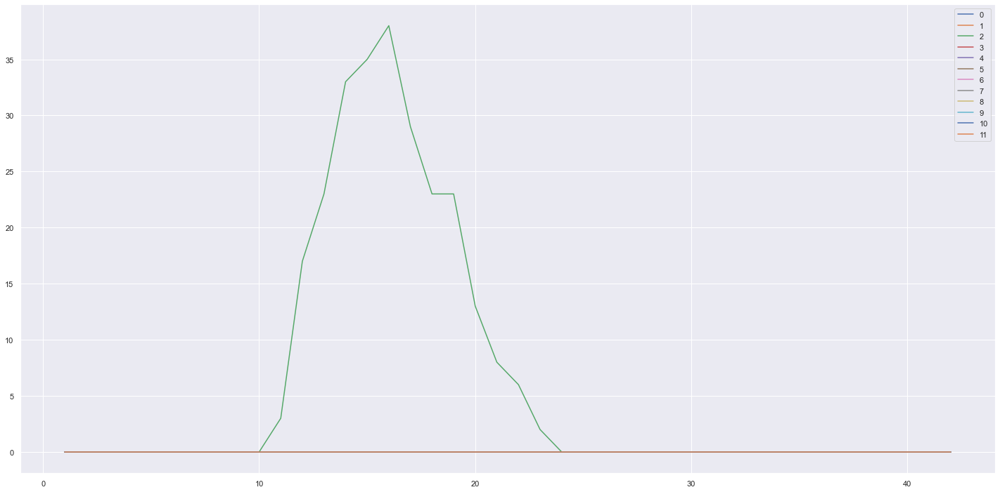

In [133]:
for i in range(0,12):
    plt.plot(tata[tata.Pattern==i].set_index('stp').iloc[:,4:].sum(1), label=str(i))
    plt.legend()

In [126]:
for i in range(0,12):
 print(tata[tata.Pattern==i].set_index('stp').iloc[:,4:].equals(tata[tata.Pattern==(i+1)].set_index('stp').iloc[:,4:]))

False
False
True
True
True
False
False
True
True
True
True
True


In [57]:
tata[tata.Pattern==(i+1)]

,Network,stim,stp,patt_no,Pattern,V1,TO,AT,PFL,PML,M1L,A1,AB,PB,PFI,PMI,M1I


<AxesSubplot:xlabel='stp'>

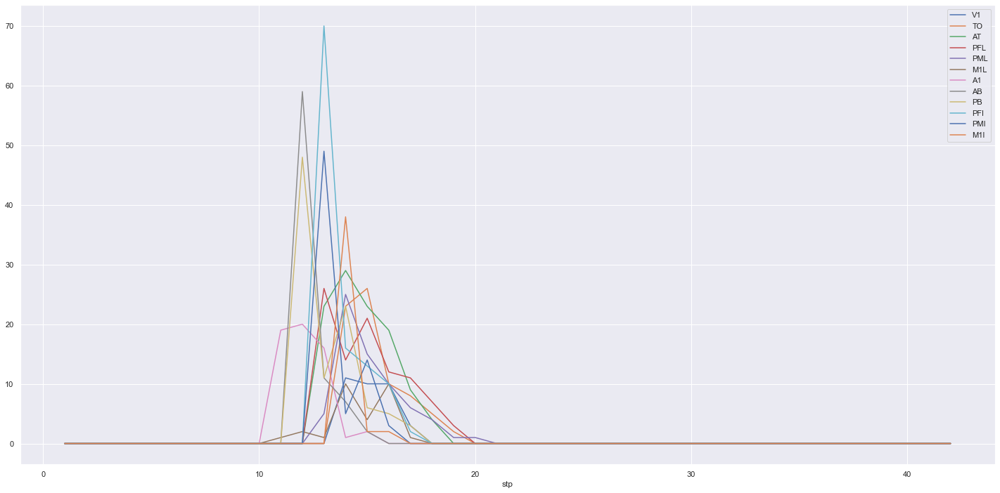

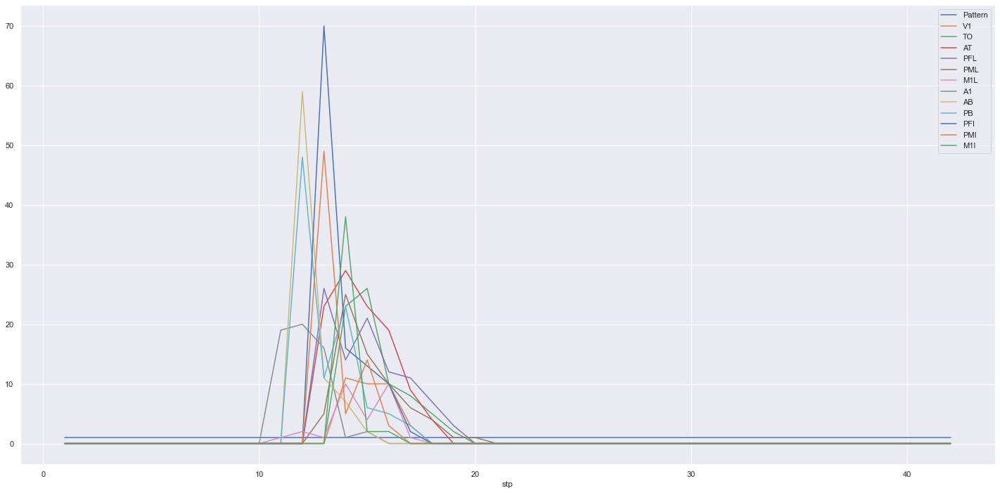

In [54]:
tata[tata.Pattern==1].set_index('stp').iloc[:,4:].plot()
tata[tata.Pattern==1].set_index('stp').iloc[:,3:].plot()

In [136]:
directory = "/Users/mc/Downloads/results_R1/Recording_current_value_rate_area.txt"
df = pd.read_csv(directory, sep = " |\t")
tata = df
#tata = df[df.patt_no==(df.Pattern+1)]#.xs(3000,0,'Presentation')#.groupby(['Specificity', 'Presentation', 'stp']).mean()
tata = tata[tata.stim==1]
#tata = tata[tata.patt_no==2]
tata = tata[tata.Network==0]#.iloc[:,5:].plot()
tata

,Network,stim,stp,patt_no,V1,TO,AT,PFL,PML,M1L,A1,AB,PB,PFI,PMI,M1I
1,0,1,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0,1,2,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0,1,3,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0,1,4,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0,1,5,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
500,0,1,38,12,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
501,0,1,39,12,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
502,0,1,40,12,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
503,0,1,41,12,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<AxesSubplot:>

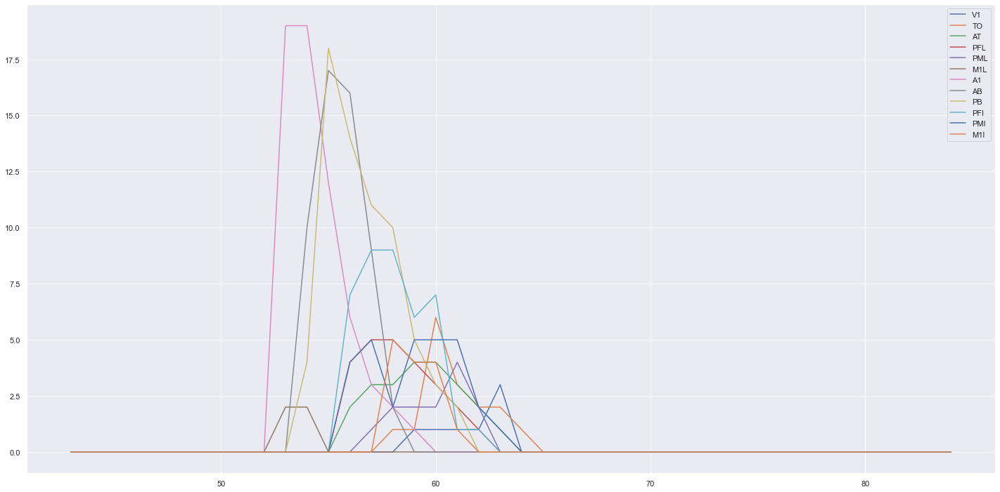

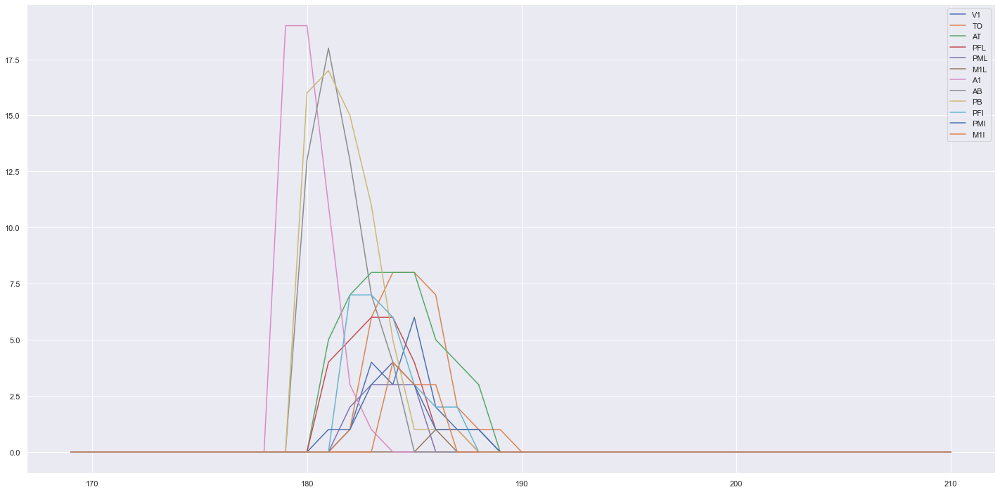

In [135]:
tata = tata[tata.Network==0]
tata[tata.patt_no==2].iloc[:,4:].plot()
tata[tata.patt_no==5].iloc[:,4:].plot()

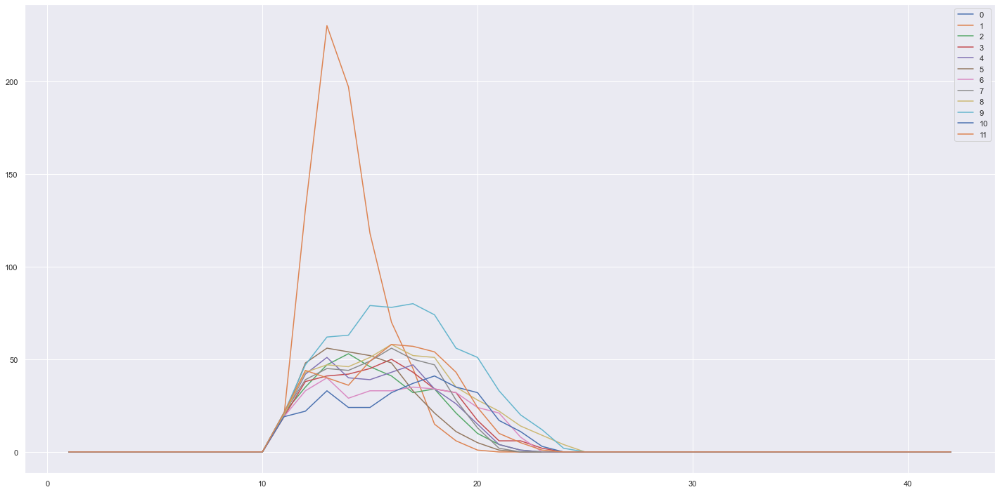

In [138]:
for i in range(0,12):
    plt.plot(tata[tata.patt_no==i].set_index('stp').iloc[:,4:].sum(1), label=str(i))
    plt.legend()

In [115]:
tata

,Network,stim,stp,patt_no,Pattern,V1,TO,AT,PFL,PML,M1L,A1,AB,PB,PFI,PMI,M1I
